#Projet Analyse Factorielle MLSD
Binôme : 
* Moustapha Alifei Salimata
* Sania Ur Rehman


# Installation et importation des bibliothèques qui nous interessent

In [ ]:
!pip install transformers
!pip install rpy2
!pip install hdbscan
!pip install umap-learn
!pip install coclust
!pip install scikit-learn==0.22.2

In [ ]:
import rpy2.robjects.numpy2ri
from rpy2.robjects.packages import importr
rpy2.robjects.numpy2ri.activate()
utils_r = importr('utils')
utils_r.install_packages('FCPS', repos="https://cloud.r-project.org")
utils_r.install_packages('clustrd', repos="https://cloud.r-project.org")

base = importr('base')
fcps = importr('FCPS')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib

from gensim.scripts.glove2word2vec import glove2word2vec
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors

from umap import UMAP
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.cluster import KMeans, SpectralClustering, AgglomerativeClustering
import hdbscan
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, normalized_mutual_info_score, adjusted_rand_score
from coclust.evaluation.external import accuracy

from sklearn.preprocessing import LabelEncoder 


from torch.utils.data import DataLoader

from transformers import BertModel, BertTokenizer, RobertaModel, RobertaTokenizer
from scipy.optimize import linear_sum_assignment
from scipy.optimize import linear_sum_assignment
from tqdm import tqdm

import requests
import warnings
import torch
import re

import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('stopwords')

# Importation du module "utils" contenant des fonctions necessaires au fonctionnement du code
# Fichier partagé par Mme Mira Ait Saada lors de la séance de tp
import sys
dir_path = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/"
sys.path.append(dir_path)
import utils
from DKM_DCN_tf_py import DCN, DKM

if torch.cuda.is_available():
    device = 'cuda'
else:
    device = 'cpu'

#<font color='red'> Analyse de la dataset ***bbc***</font>

## Importation des données

In [ ]:
chemin = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/data/bbc.csv"
bbc = pd.read_csv(chemin, index_col=0)
texts = bbc['text']
labels = bbc['label']

print(bbc)

nombre_de_classes = len(labels.value_counts())

                                                   text     label
0     England coach faces rap after row\n\nEngland c...     sport
1     Moody joins up with England\n\nLewis Moody has...     sport
2     Ferguson fears Milan cutting edge\n\nMancheste...     sport
3     Henry tipped for Fifa award\n\nFifa president ...     sport
4     Arnesen denies rift with Santini\n\nTottenham ...     sport
...                                                 ...       ...
2220  Commons hunt protest charges\n\nEight proteste...  politics
2221  UK set to cut back on embassies\n\nNine overse...  politics
2222  'Few ready' for information act\n\nThousands o...  politics
2223  Goldsmith: 'I was not leant on'\n\nThe attorne...  politics
2224  Hewitt decries 'career sexism'\n\nPlans to ext...  politics

[2225 rows x 2 columns]


## Distribution des classes

On remarque que les données sont distribués de façon plus ou moins homogène

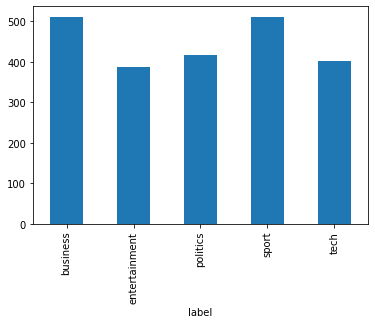

In [ ]:
bbc.groupby(['label']).size().plot(kind = "bar")

In [ ]:
labels = LabelEncoder().fit_transform(labels)
print(set(labels))

{0, 1, 2, 3, 4}


## Nettoyage des données

Pour obtenir des meilleurs résultats, on se propose de nettoyer les données afin de ne garder que les éléments les plus importants à la description des nos documents. Pour ce faire, nous allons : <br>
* Supprimer les ponctuations
* Supprimer les stopwords
* Supprimer les chiffres
* Lemmatiser le texte

En effet, nous jugeons que dans le cas de ce dataset, vu le contenu des documents, les stopwords et les chiffres n'apportent pas d'information en plus. Ce qui n'aurait pas été le cas si par exemple les données portaient sur des pathologies médicales (type **1** or **2** Diabetes, deep vein thrombosis **with** or **without** pulmonary embolism)

In [ ]:
stop_words = stopwords.words("english")

def clean_abstracts(abstracts):
  def clean_abstract(abstract, punctuations=r'''!()-[]{};:'"\,<>./?@#$%^&*_~''', stop_words=stop_words):
    
    # Suppression des ponctuations
    for character in abstract.lower():
      if character in punctuations:
        abstract = abstract.replace(character, "")

    # Suppression des stopwords
    abstract = ' '.join([word for word in abstract.split() if word not in stop_words])

    # Suppression des chiffres
    abstract = re.sub(r'[0-9]+', '', abstract)

    # Lemmatisation
    abstract = ' '.join([WordNetLemmatizer().lemmatize(words) for words in abstract.split()])

    return abstract
  return [clean_abstract(abstract.lower()) for abstract in abstracts]


texts = clean_abstracts(texts)

In [ ]:
def affichage(list_X, list_pred_labels, labels, list_titles):
  fig = plt.figure(figsize=(24,14))
  outer = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.3)

  ligne = 0
  
  for ligne_i in range(2):
    for i in range(2):
      # set outer titles
      ax = plt.Subplot(fig, outer[ligne_i, i])
      ax.set_title(list_titles[ligne], fontsize=15)
      ax.axis('off')
      fig.add_subplot(ax)

      inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=outer[ligne_i, i], wspace=0.1, hspace=0.1)
      
      ax1 = plt.Subplot(fig, inner[0])
      for j in set(labels):
        ax1.scatter(list_X[ligne][labels==j, 0], list_X[ligne][labels==j, 1], label=str(j))
      ax1.set_title("True labels", fontsize=10)
      fig.add_subplot(ax1)

      ax2 = plt.Subplot(fig, inner[1])
      for j in set(list_pred_labels[ligne]):
        ax2.scatter(list_X[ligne][list_pred_labels[ligne]==j, 0], list_X[ligne][list_pred_labels[ligne]==j, 1], label=str(j))
      ax2.set_title("Pred labels", fontsize=10)
      fig.add_subplot(ax2)

      ligne = ligne + 1
  fig.show()

  # Affichage des matrices de confusion
  fig_confusion_matrix = plt.figure(figsize=(24,5))
  outer_cm = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

  for i in range(4):
    axe = plt.Subplot(fig_confusion_matrix, outer_cm[i])
    cm_plot = ConfusionMatrixDisplay(confusion_matrix(labels, list_pred_labels[i]), display_labels=set(labels)).plot(ax=axe)
    cm_plot.ax_.set_title(f"Matrice de confusion {list_X_titles[i]}")
    fig_confusion_matrix.add_subplot(axe)
    
  fig_confusion_matrix.show()


# comparaison entre les vrais labels et des labels prédits
def eval_clustering_2D(X_reduced, labels_pred, labels_true):

  print('\nAccuracy : ', round(accuracy(labels_true, labels_pred), 2))
  print('NMI : ', round(normalized_mutual_info_score(labels_true, labels_pred), 2))
  print('ARI : ', round(adjusted_rand_score(labels_true, labels_pred), 2))

  color = ['red', 'blue', 'green', 'yellow', 'purple', 'brown', 'pink', 'gray', 'black']

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  for i in set(labels_pred.tolist()):
    axes[0].scatter(X_reduced[labels_pred == i, 0], X_reduced[labels_pred == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[0].set_title("predicted labels")
  axes[0].legend()

  for i in set(labels_true.tolist()):
    axes[1].scatter(X_reduced[labels_true == i, 0], X_reduced[labels_true == i, 1], s = 50, c = color[i], label = 'Cluster ' + str(i))
  axes[1].set_title("true labels")
  axes[1].legend()

  plt.show()

  print()

  fig, axes = plt.subplots(1, 2, figsize=(15,5), sharey='row')

  cf_matrix = confusion_matrix(labels_true, labels_pred)
  disp = ConfusionMatrixDisplay(cf_matrix, display_labels=set(labels_true))
  disp.plot(ax=axes[0])
  disp.ax_.set_title("Confusion matrix, without normalization")

  cf_matrix2 = confusion_matrix(labels_true, labels_pred, normalize='all')
  disp2 = ConfusionMatrixDisplay(cf_matrix2, display_labels=set(labels_true))
  disp2.plot(ax=axes[1])
  disp2.ax_.set_title("Normalized confusion matrix")

  plt.subplots_adjust(wspace=0.40, hspace=0.1)

  plt.show()

## Embeddings

#### Word2vec

In [ ]:
w2v = KeyedVectors.load_word2vec_format("/content/drive/MyDrive/Cours/M2/Analyse factorielle/word2vec.bin.gz", binary=True)
get_w2v_vector = lambda x:w2v[x] if x in w2v.vocab else None

x_w2v = utils.static_document_embeddings(get_w2v_vector, texts, utils.tokenize_re)
print("Dimensions de la matrice word2vec : ", x_w2v.shape)

Dimensions de la matrice word2vec :  (2225, 300)


#### Glove

In [ ]:
glove_file = datapath('test_glove.txt')
tmp_file = get_tmpfile("test_word2vec.txt")
_ = glove2word2vec(glove_file, tmp_file)

model = KeyedVectors.load_word2vec_format(tmp_file)

get_glove_vector = lambda x:model[x] if x in model.vocab else None
x_glove = utils.static_document_embeddings(get_glove_vector, bbc['text'], utils.tokenize_re)
print("Dimensions de la matrice glove : ", x_glove.shape)

Dimensions de la matrice glove :  (2225, 50)


# Partie 1 : Méthodes Tandem

## Matrice Word2Vec

### Méthodes de réduction de dimensions



Le clustering est une tâche difficile à realiser sur des données de grandes dimensions non seulement par le temps de calcul mais egalement par le fait que les données ont generalement des distances similaires sur des espaces plus grands. Pour cela, on se propose de reduire les dimensions de nos matrices word2vec et glove.

 #### ACP

Notre objectif ici est de reduire suffisament la dimension des données pour  pouvoir appliquer un clustering après mais egalement garder le plus d'information dans l'espace reduite pour distinguer au mieux les classes. Pour ce faire, nous effectuons une ACP sur les deux matrices et gardons les premières composantes qui renferment au moins 80% de l'information contenue dans les matrices

Nombre composantes considéré pour x_glove : 5
Nombre composantes considéré pour x_w2v : 55



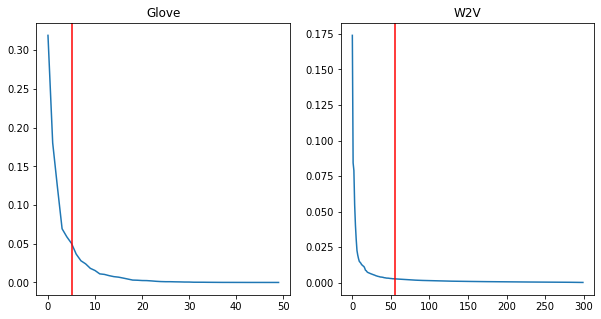

In [ ]:
fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(1, 2)

X = [x_glove, x_w2v]
X_label = ["Glove", "W2V"]
n_composantes_pca = []

for j in range(2):
  pca = PCA()
  X_reduced_pca = pca.fit_transform(X[j])
  y = pca.explained_variance_ratio_

  n_composantes_pca.append(np.where(np.cumsum(y) > 0.80)[0][0])

  x_composantes = np.arange(X[j].shape[1])

  axes[j].plot(x_composantes, y)
  axes[j].set_title(X_label[j])
  axes[j].axvline(n_composantes_pca[j], color="red", label=f"Composante {n_composantes_pca[j]}")

fig.show()

print(f"Nombre composantes considéré pour x_glove : {n_composantes_pca[0]}\nNombre composantes considéré pour x_w2v : {n_composantes_pca[1]}\n")

#### TSNE

L'algorithme t-sne se base sur une notion de voisinage et a comme objectif de conserver la distance relative entre deux points de l'espace de départ. Ici, ayant des données de grandes dimensions, on initialise l'algorithme avec les perplexités 30 et 50 pour tester l'influence de prendre des "voisins" plus ou moins éloignés. <br>

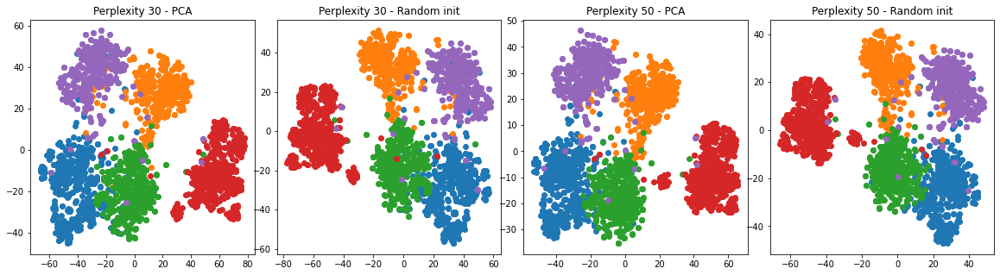

In [ ]:
X = x_w2v
list_X = []

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  list_X.append(TSNE(n_components=2, perplexity=30, init='pca').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=30, init='random').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=50, init='pca').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=50, init='random').fit_transform(X.copy()))


# ------ Affichage ------

list_X_titles = ["Perplexity 30 - PCA", "Perplexity 30 - Random init", "Perplexity 50 - PCA", "Perplexity 50 - Random init"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

On remarque que même avec seulement deux composantes dans l'espace reduite, l'algorithme t-sne arrive à relativement bien séparer les classes. <br>
On remarque également qu'en prenant une perplexité plus grande, les classes sont légèrement plus denses.

#### Autoencodeurs

Les autoencodeurs sont un moyen très efficace pour la reduction de dimension. Mais comme on peut s'en douter, il est difficile d'entrainer un réseau de neuronnes à apprendre uniquement une compression à deux dimensions et donc l'utiliser pour la visualisation. On peut néamoins légèrement contourner ce problème en entrainant le modèle sur plusieurs epochs comme on peut le voir ci-dessous.

100%|██████████| 500/500 [00:51<00:00,  9.74it/s]


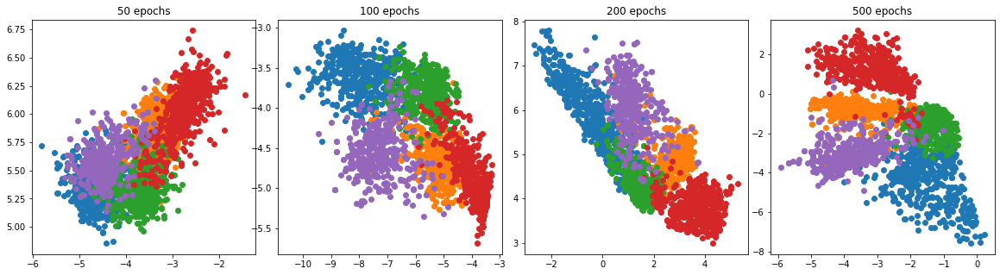

In [ ]:
X = x_w2v
list_X = []

list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=50))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=100))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=500))


# ------ Affichage ------

list_X_titles = ["50 epochs", "100 epochs", "200 epochs", "500 epochs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

Plus on entraine le modèle sur des epochs plus longues plus la variance intra-classe diminue et on arrive à distinguer les classes. Toutesfois, pour la classification non supervisée, nous allons considerer un espace reduit de taille 20 alors que pour les visualisations nous allons utiliser le modèle à sortie de deux composantes avec un nombre d'epochs égal à 200.

#### UMAP

L'UMAP, comme la t-sne, effectue une reduction de dimension sur la base du notion de voisinage. Mais contrairement à la t-sne (à quelques paramètres près), l'UMAP garde une répresentation globale des points en plus de leur proximité, ce qui nous intéresse après lors de la classification car plus les distances interclasses sont consrvés, plus il est "simple" de distinguer les classes. <br>
Un hyperparamètre important de l'algorithme UMAP est le nombre de voisins k qu'on considère pour regrouper le points afin de supprimer les dimensions. En effet, si on choisi un k trop petit on obtient des petits regroupements isolés de points alors que si on choisi un $k$ trop grand, tous les points sont connectés et on obtient un cluster géant.

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


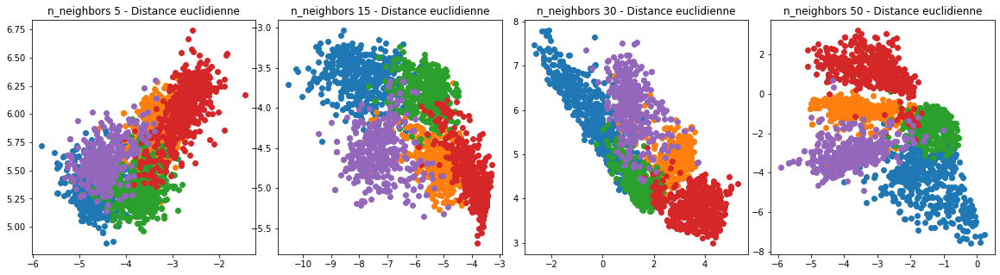

In [ ]:
X = x_w2v
list_X

list_X.append(UMAP(n_components=2, n_neighbors=5).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=15).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=50).fit_transform(X.copy()))


# ------ Affichage ------

list_X_titles = ["n_neighbors 5 - Distance euclidienne", "n_neighbors 15 - Distance euclidienne", 
                 "n_neighbors 30 - Distance euclidienne", "n_neighbors 50 - Distance euclidienne"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

On retient alors les matrices suivantes pour la suite de l'analyse

100%|██████████| 200/200 [00:21<00:00,  9.52it/s]


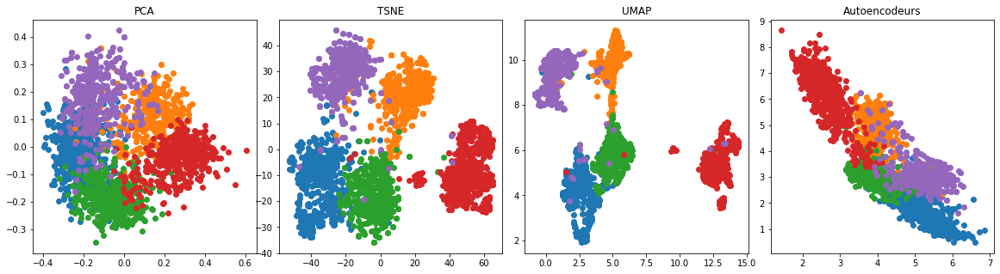

In [ ]:
X = x_w2v

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

### Clustering par k-means




100%|██████████| 50/50 [00:05<00:00,  9.52it/s]


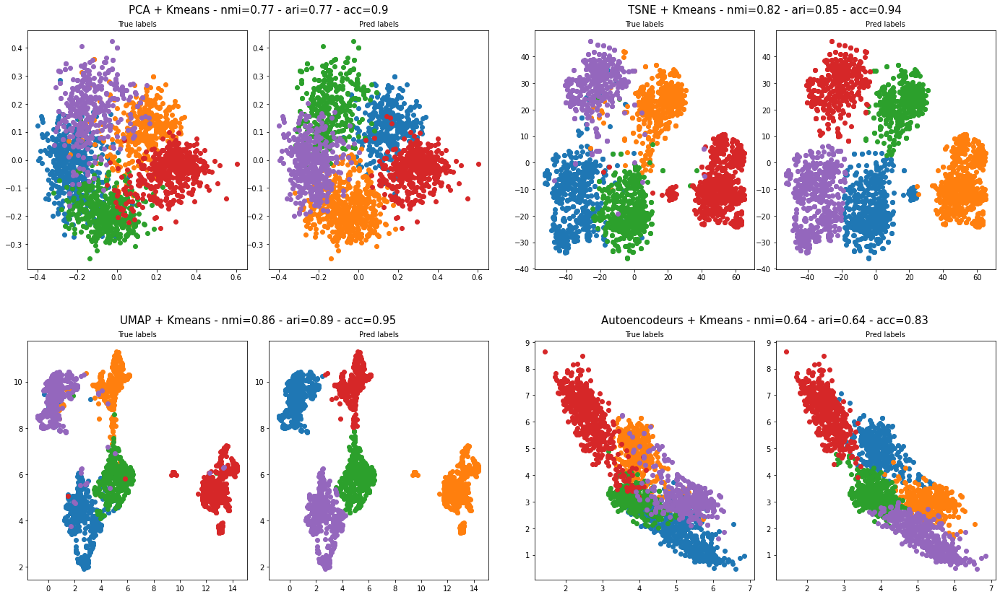

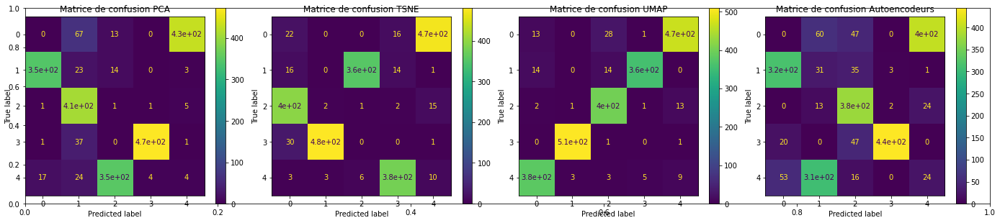

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
  nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
  ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

On voit ici que l'algorithme k-means arrive à bien classifier les points. Ceci est en partie dû au fait que les algorithmes de reduction on su regrouper les points assez pour que les variances intra-classes soient petites. Et K-means étant efficace pour reconnaitre les classes "spheriques", on obtient ces résultats.

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:05<00:00,  9.45it/s]


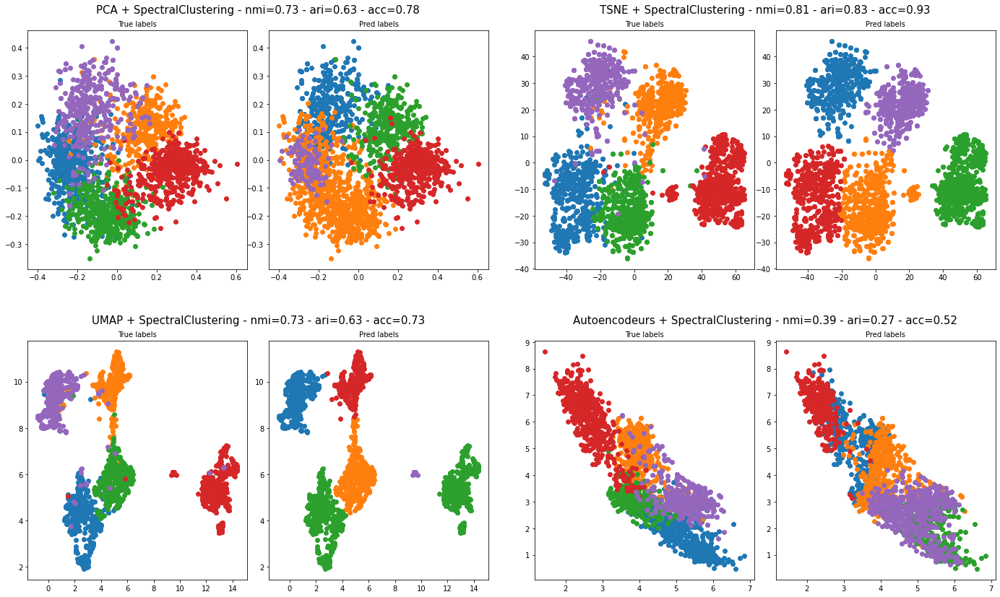

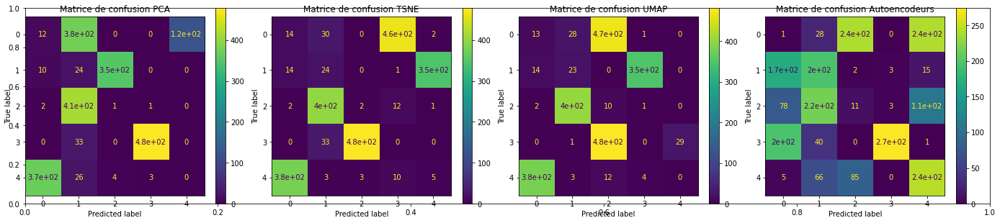

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

Ici on remarque que le spectral k-means a un peu plus de mal  à classifier des points que l'on voudrait voir dans la même classe (par exemple la classe rouge dans le graphe UMAP. Cela s'explique par le fait que le spectral k-means se base plus sur les similarités entre les points que leur distances pour les classifier. En effet, le spectral k-means crée une répresentation en graphe connecté de la matrice de départ et le problème de classification devient alors un problème de partionnement dudit graphe.

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


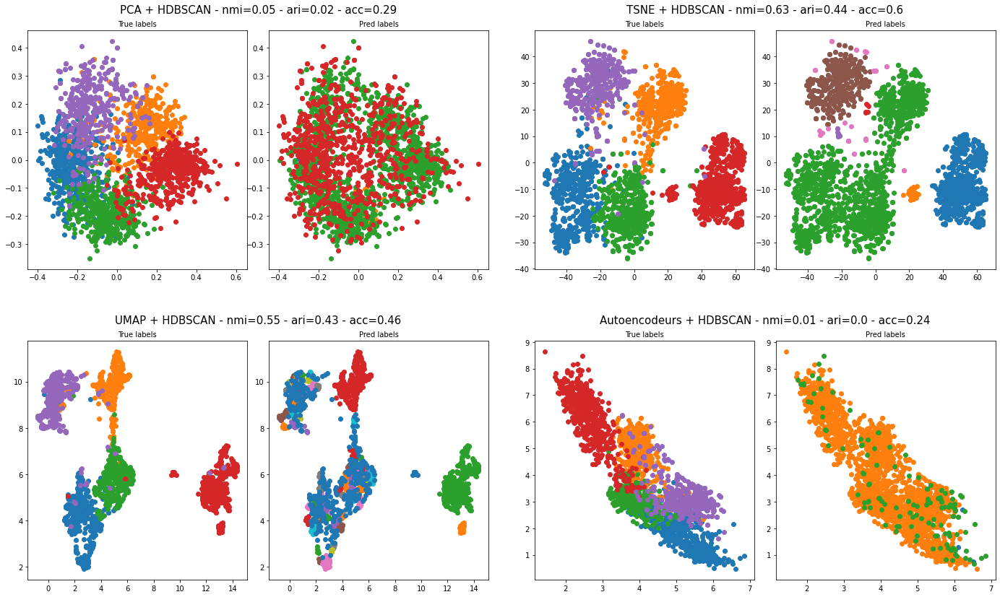

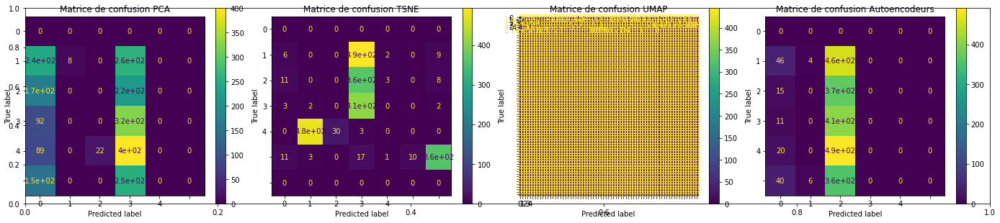

In [ ]:
X = x_w2v

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

L'algorithme HDBSCAN se basant sur la densité des points pour les classifier, on voit rapidement qu'il n'est pas très adapté aux matrices qu'on a. En effet quand la variance inter-classe est un peu élévée et que les classes se croisent (Figure PCA, TSNE et Autoencodeurs), l'algorithme considère que ces classes ne forment qu'une et seule grande classe. Dans le cas où les classes sont denses (comme pour la figure UMAP), HDBSCAN considère qu'à la moindre petite séparation, on est en présence d'une nouvelle classe, ce qui se traduit par un très grand nombre de classes comme on peut le voir ci-haut.

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:05<00:00,  9.44it/s]


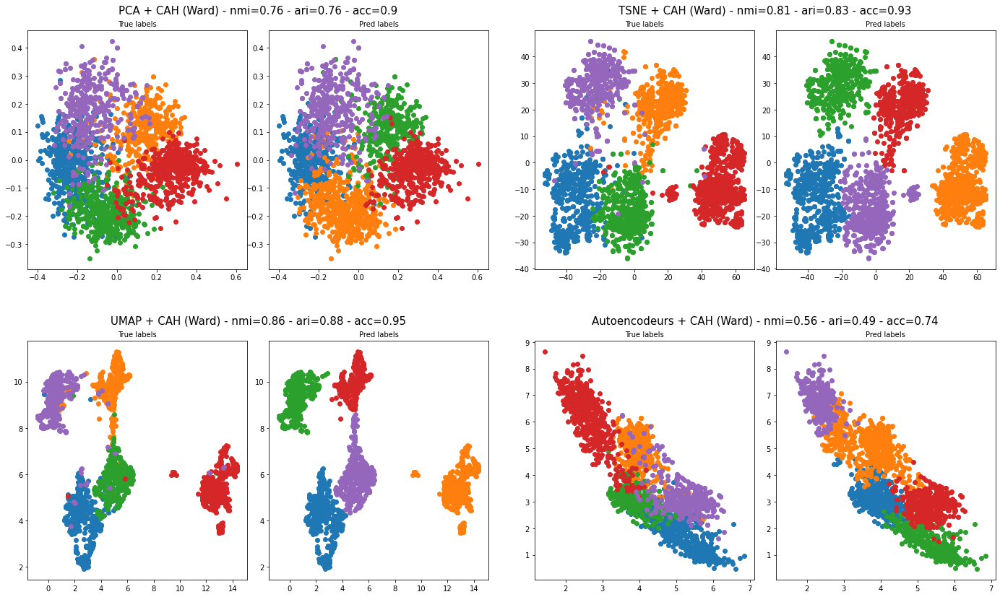

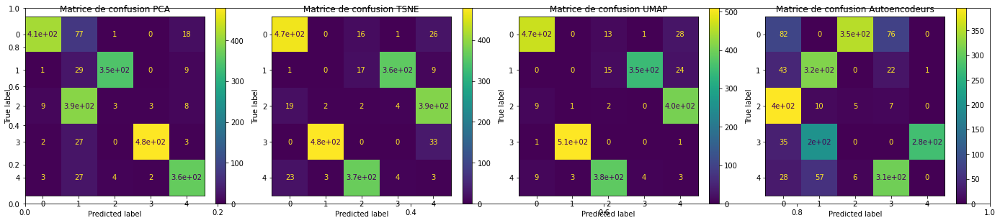

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:05<00:00,  9.43it/s]


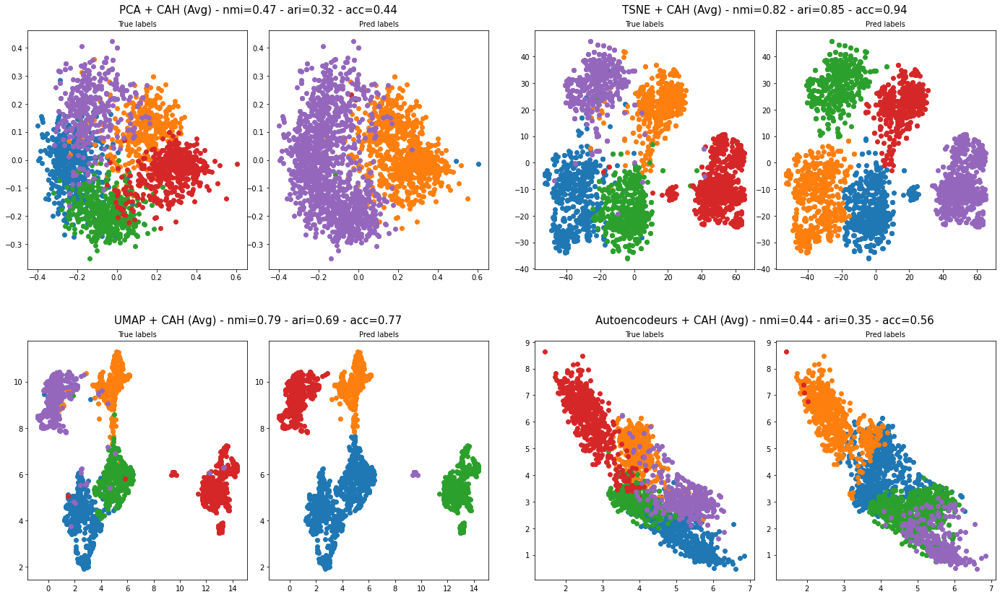

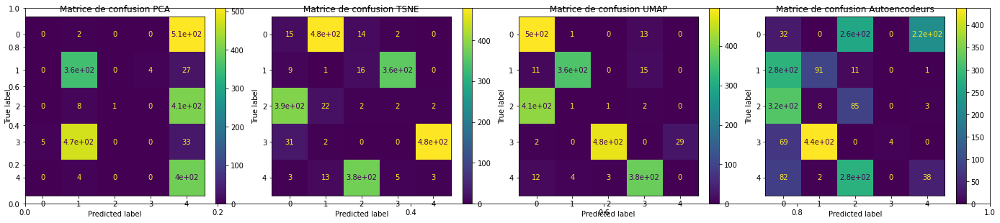

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Avg) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.77  0.77  0.82  0.86          0.64
Spectral k-means                   0.73  0.73  0.81  0.73          0.39
HDBSCAN                            0.03  0.05  0.63  0.55          0.01
CAH + Ward                         0.76  0.76  0.81  0.86          0.56
CAH + distance moyenne             0.01  0.47  0.82  0.79          0.44 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.77  0.77  0.85  0.89          0.64
Spectral k-means                   0.63  0.63  0.83  0.63          0.27
HDBSCAN                            0.01  0.02  0.44  0.43             0
CAH + Ward                         0.77  0.76  0.83  0.88          0.49
CAH + distance moyenne               -0  0.32  0.85  0.69          0.35 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                             0

## Matrice Glove

### Méthodes de réduction de dimensions


100%|██████████| 200/200 [00:20<00:00,  9.73it/s]


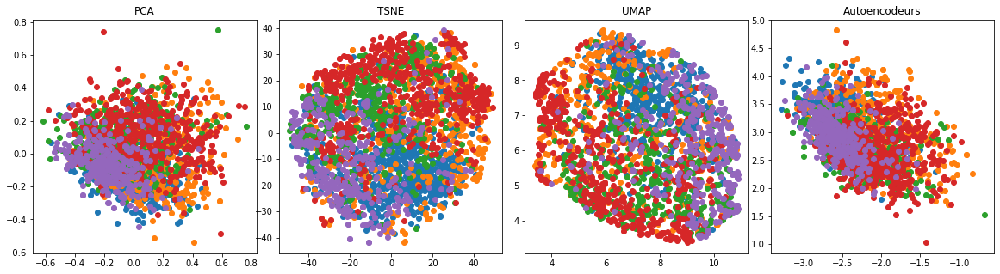

In [ ]:
X = x_glove

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

On remarque que l'embedding par glove ne nous permet pas de distinguer les classes comme il faut. Cela peut s'expliquer par le fait qu'il ne considère que 50 dimensions pour expliquer les documents, ce qui est vraiment faible vu la taille de chaque abstract et des differents mots/contextes qui en découlent.<br>
Par conséquent, les analyses qui séront faites sur cette matrice donneront toutes des résultats médiocres comparé à la matrice word2vec.

### Clustering par k-means


100%|██████████| 50/50 [00:05<00:00,  9.96it/s]


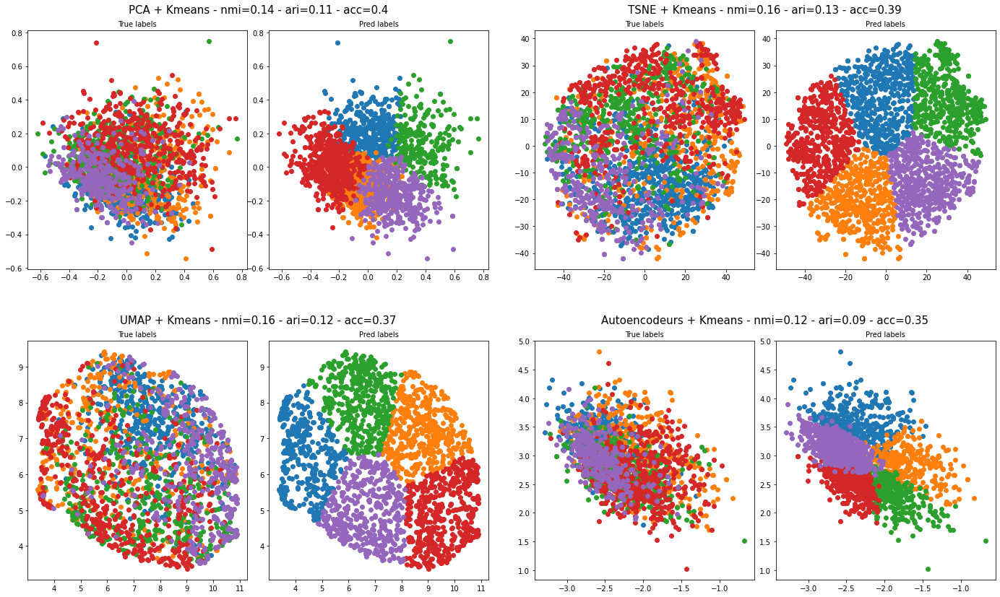

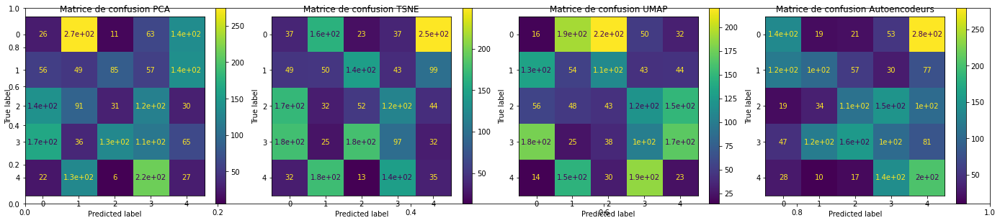

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par spectral k-means


100%|██████████| 50/50 [00:05<00:00,  9.57it/s]


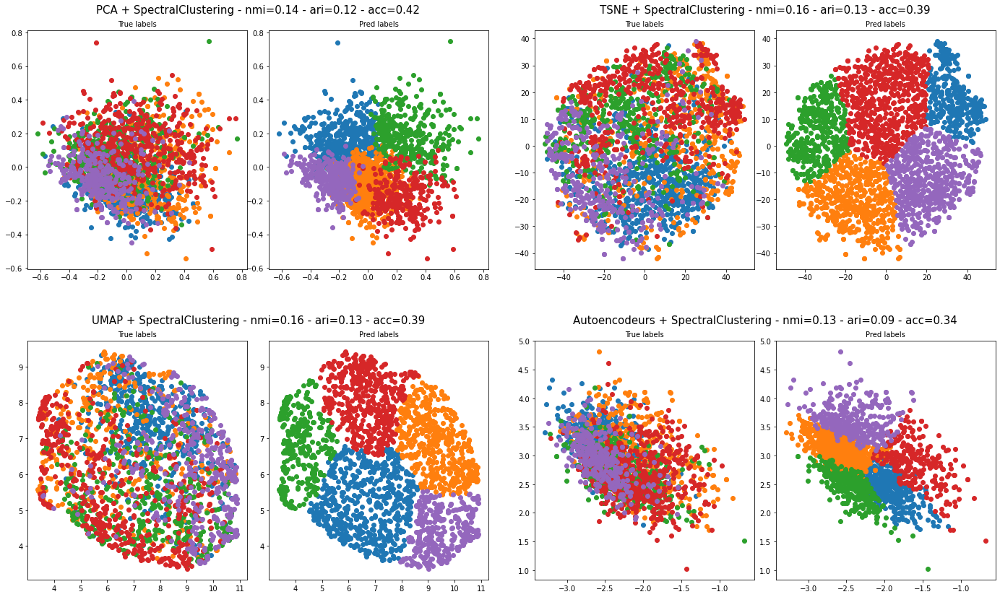

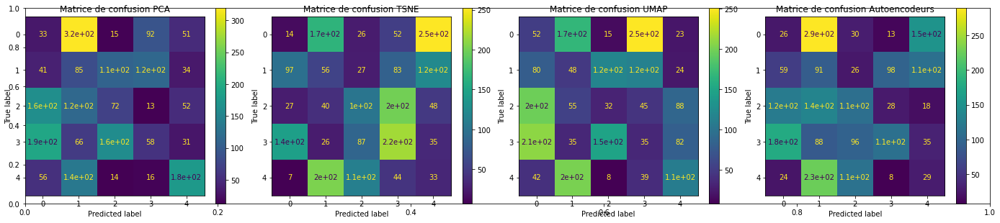

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:05<00:00,  9.69it/s]


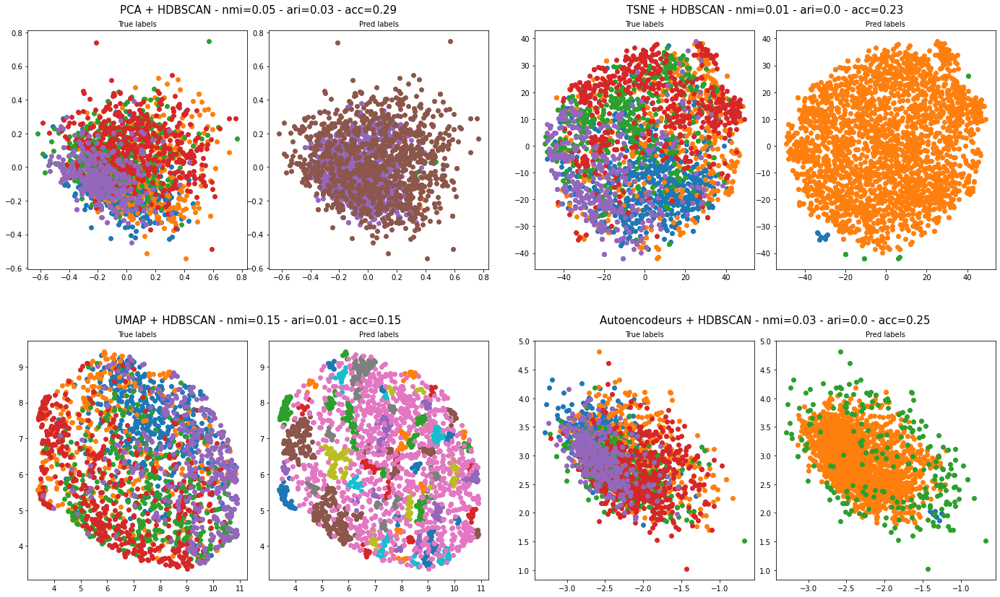

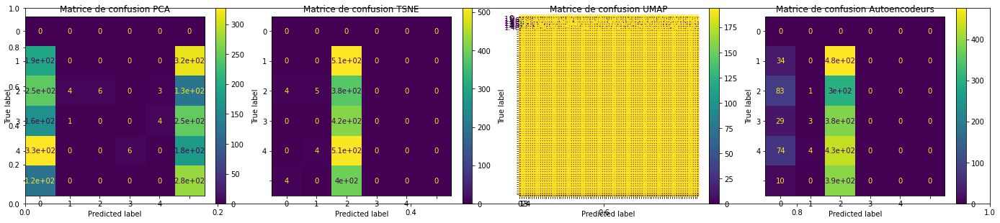

In [ ]:
X = x_glove

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:05<00:00,  9.55it/s]


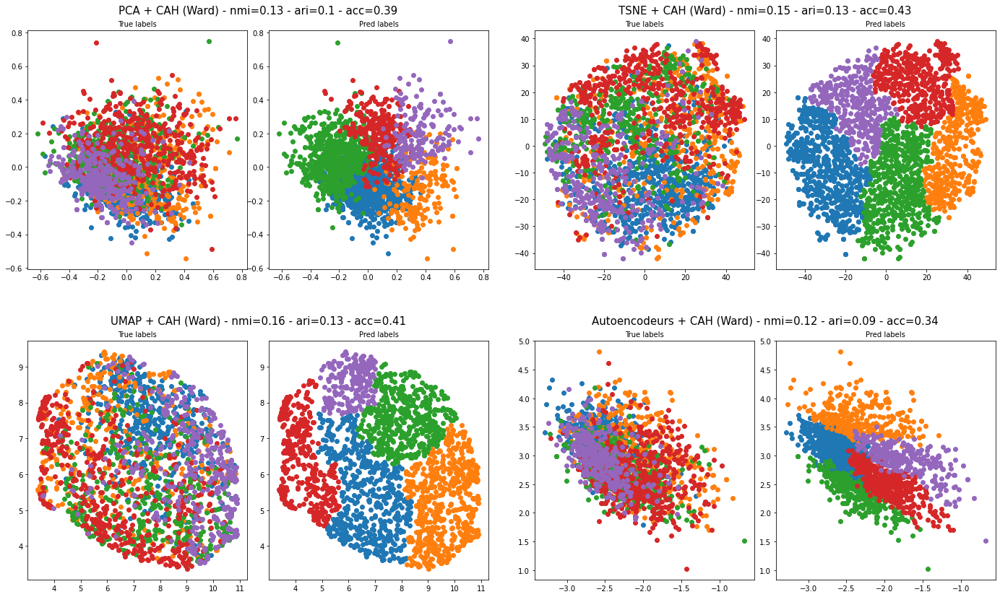

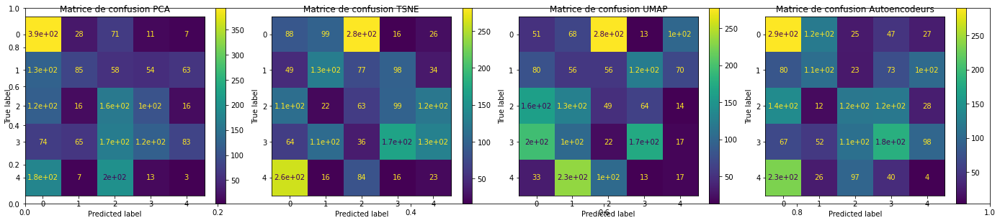

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:05<00:00,  9.72it/s]


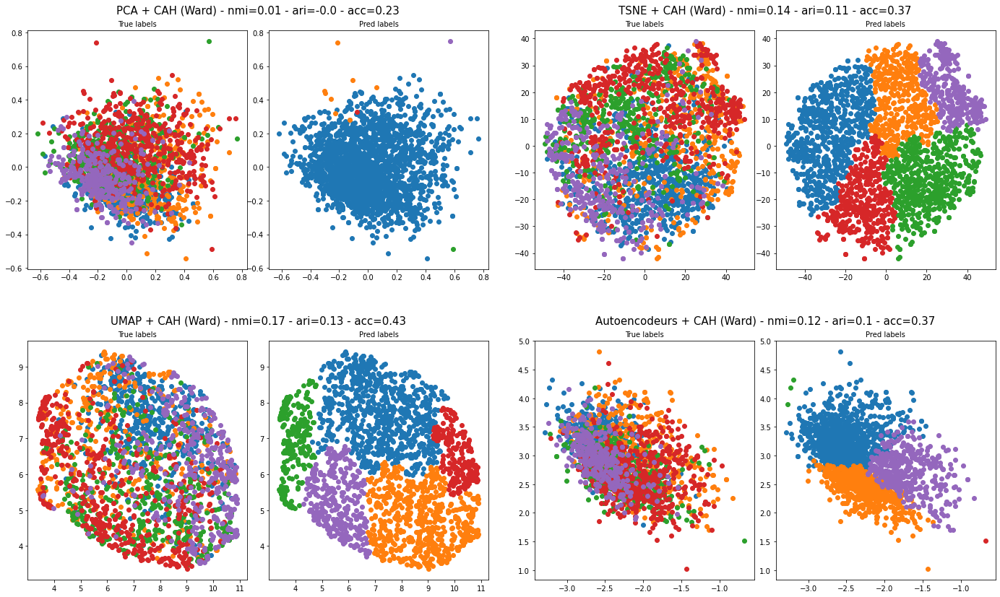

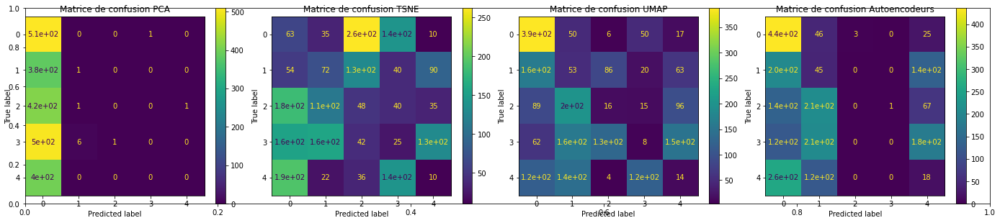

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.14  0.14  0.16  0.16          0.12
Spectral k-means                   0.16  0.14  0.16  0.16          0.13
HDBSCAN                            0.07  0.05  0.01  0.15          0.03
CAH + Ward                         0.12  0.13  0.15  0.16          0.12
CAH + distance moyenne             0.01  0.01  0.14  0.17          0.12 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                             0.1  0.11  0.13  0.12          0.09
Spectral k-means                   0.13  0.12  0.13  0.13          0.09
HDBSCAN                            0.05  0.03     0  0.01             0
CAH + Ward                         0.07   0.1  0.13  0.13          0.09
CAH + distance moyenne                0    -0  0.11  0.13           0.1 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

# Partie 2 


## Matrice Word2Vec

### Reduced K-means

Reduced k-means et Factorial k-means sont 2 techniques permettant de réaliser simultanément la réduction de dimensions et le clustering, de manière à ce que l'espace réduit contient les informations les plus utiles pour le partitionnement des objets.



In [ ]:
import tensorflow.compat.v1 as tf

n_components = 15
X = x_w2v
k = nombre_de_classes


rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = rkm[0]

X_reduced = rkm = rkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_rkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_rkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Reduced k-means sur le jeu de données bbc présente de très bons résultats. Les 3 métriques d'évaluation ont un score élevé (> 75%).

Au niveau de la visualisation 2D, on voit 5 clusters très proches avec plusieurs points se superposant. Les clusters ont une forme sphérique.

### Factorial K-means

In [ ]:
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = fkm[0]

X_reduced = fkm = fkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_fkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_fkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Factorial k-means sur le jeu de données bbc présente de très bons résultats. Les 3 métriques d'évaluation ont un score relativement élevé (> 70%).

Au niveau de la visualisation 2D, on voit 5 clusters se superposant et ayant une forme sphérique.

### Deep Clustering Network (DCN)

In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dcn_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dcn_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep Clustering Network sur le jeu de données bbc présente de très bons résultats. Les 3 métriques d'évaluation ont un score élevé (> 80%)

### Deep k-means (DKM)

In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep k-means sur le jeu de données bbc présente de très bons résultats. Les 3 métriques d'évaluation ont un score très élevé (> 84%)

### Tableau récapitulatif

In [ ]:
df_w2v_bbc = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm_w2v_bbc, acc_fkm_w2v_bbc, acc_dcn_w2v_bbc, acc_dkm_w2v_bbc], 
                                  [nmi_rkm_w2v_bbc, nmi_fkm_w2v_bbc, nmi_dcn_w2v_bbc, nmi_dkm_w2v_bbc],
                                  [ari_rkm_w2v_bbc, ari_fkm_w2v_bbc, ari_dcn_w2v_bbc, ari_dkm_w2v_bbc],
                                  ])
df_w2v_bbc

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.90,0.88,0.92,0.94
NMI,0.77,0.71,0.82,0.84
ARI,0.77,0.72,0.82,0.86


Deep k-means est la technique la plus performante parmi les 4 pour le clustering et la réduction de dimension simultané. En effet, elle a les meilleurs résultats sur les 3 métriques d'évaluation. 
On constate tout de fois que les résultats des autres méthodes sont également bons.

## Matrice glove

### Reduced K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.43
NMI :  0.15
ARI :  0.12


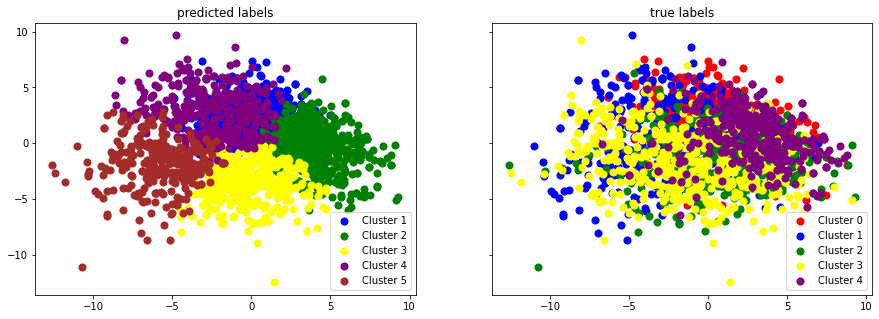

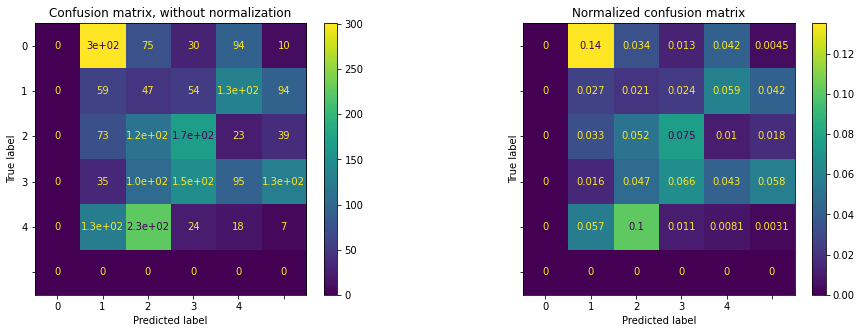

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
n_components = 15
X = x_glove
k = nombre_de_classes

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = rkm[0]

X_reduced = rkm = rkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_rkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_rkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Reduced k-means sur le jeu de données bbc présente de mauvais résultats. 2 des 3 métriques d'évaluation ont un score très fiables (< 20%)

### Factorial K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.43
NMI :  0.15
ARI :  0.12


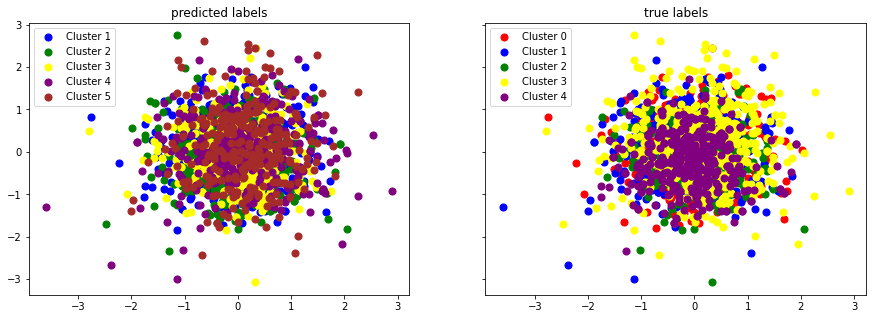

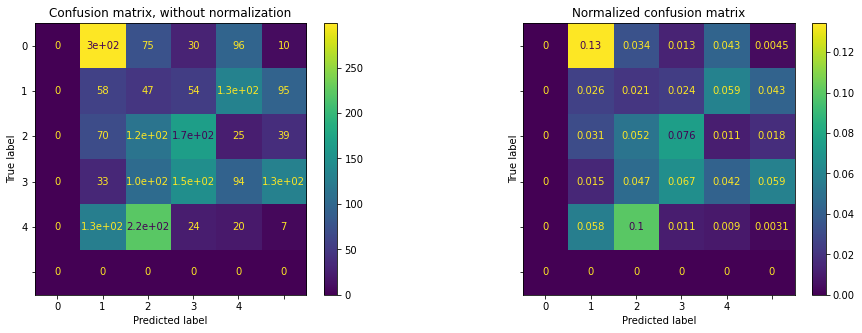

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = fkm[0]

X_reduced = fkm = fkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_fkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_fkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Factorial k-means sur le jeu de données bbc présente de mauvais résultats. 2 des 3 métriques d'évaluation ont un score très fiables (< 20%).

Au niveau de la visualisation 2D, on voit 5 clusters se superposant totalement.

### Deep Clustering Network (DCN)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 30.43it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:10<00:00,  4.84it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.43
NMI :  0.16
ARI :  0.13


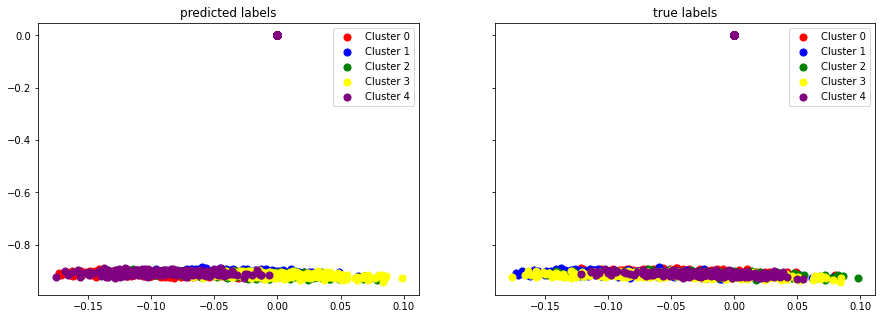

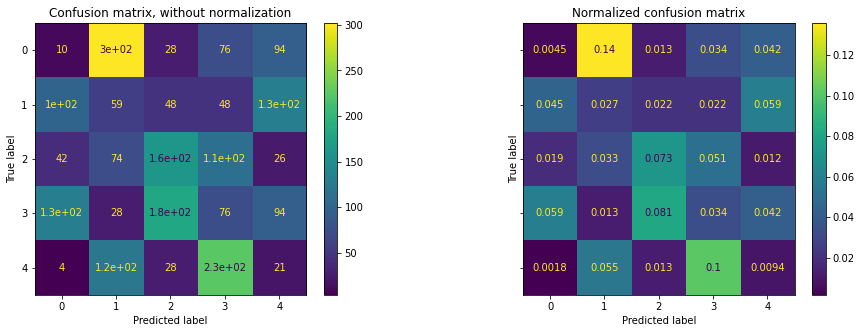

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dcn_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dcn_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep Clustering Network sur le jeu de données bbc présente de mauvais résultats. 2 des 3 métriques d'évaluation ont un score très fiables (< 20%).

Au niveau de la visualisation 2D, on voit 5 clusters totalement écrasés par rapport à la composante parincipale 1.

### Deep k-means (DKM)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:01<00:00, 29.20it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:06<00:00,  2.96it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.4
NMI :  0.15
ARI :  0.11


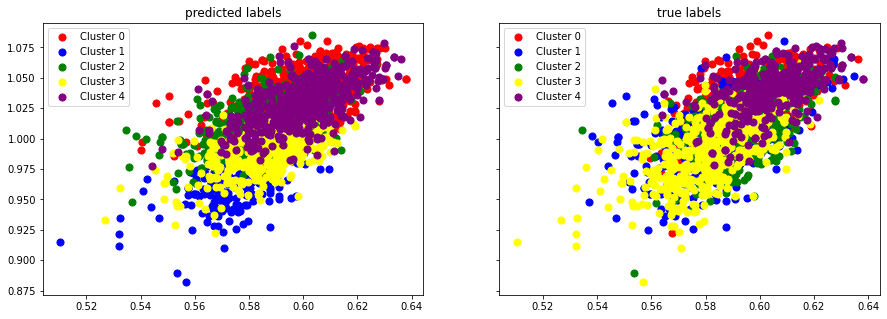

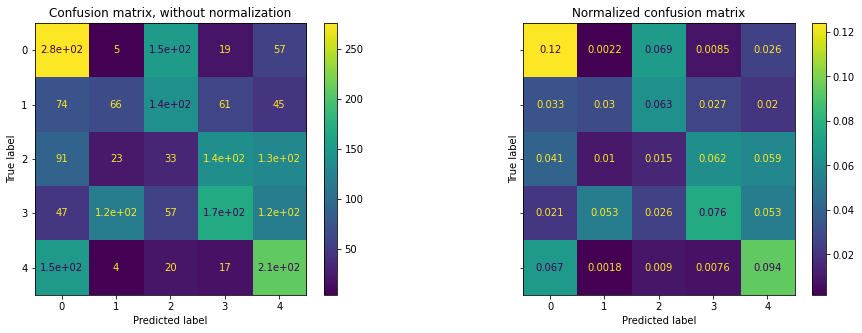

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du RDeep k-means sur le jeu de données bbc présente de mauvais résultats. 2 des 3 métriques d'évaluation ont un score très fiables (< 20%)

### Tableau récapitulatif

In [ ]:
df_w2v_bbc = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm_w2v_bbc, acc_fkm_w2v_bbc, acc_dcn_w2v_bbc, acc_dkm_w2v_bbc], 
                                  [nmi_rkm_w2v_bbc, nmi_fkm_w2v_bbc, nmi_dcn_w2v_bbc, nmi_dkm_w2v_bbc],
                                  [ari_rkm_w2v_bbc, ari_fkm_w2v_bbc, ari_dcn_w2v_bbc, ari_dkm_w2v_bbc],
                                  ])
df_w2v_bbc

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.43,0.43,0.43,0.40
NMI,0.15,0.15,0.16,0.15
ARI,0.12,0.12,0.13,0.11


Les 4 techniques ont des performances similaires. Leurs résultats sont assez mauvais en termes de NMI et ARI.

On remarque le contraste entre les résultats du clustering sur les embeddings Word2vec et Glove. Avec Word2vec, les résultats sont très bons pour toutes les méthodes avec Deep k-means légèrement meilleure. Avec Glove, les résultats sont très faibles et aucune méthode ne sort du lot.

#<font color='red'> Analyse de la dataset ***classic4*** </font>

## Importation des données

In [ ]:
chemin = "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/data/classic4.csv"
classic4 = pd.read_csv(chemin, index_col=0)
texts = classic4['text']
labels = classic4['label']

print(classic4)

nombre_de_classes = len(labels.value_counts())

                                                   text label
0     Computer-Aided Analysis and Design of Informat...  cacm
1     Milestones in Cataloging In the case of the pr...  cisi
2     childhood psychosis. a description is given of...   med
3     neonatal hepatitis or familial neonatal obstru...   med
4     Handbook of Comparative Librarianship The firs...  cisi
...                                                 ...   ...
7090  throat and nose surgery in patients with const...   med
7091  Computers and Society: A Proposed Course for C...  cacm
7092                 Romberg Integration (Algorithm 60)  cacm
7093  Semantic Evaluation from Left to Right This pa...  cacm
7094       Toward Standards for Handwritten Zero and Oh  cacm

[7095 rows x 2 columns]


## Distribution des classes

On remarque que la classe "cacm" survient beaucoup plus souvent que les autres. En effet, il y a deux fois plus de documents classés "cacm" que "cisi", "cran" ou "med".

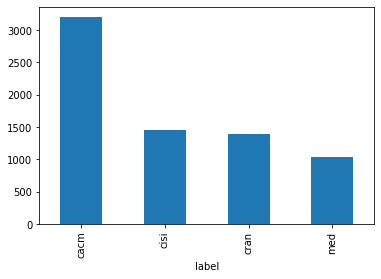

In [ ]:
classic4.groupby(['label']).size().plot(kind = "bar")

In [ ]:
labels = LabelEncoder().fit_transform(labels)
print(set(labels))

{0, 1, 2, 3}


## Embeddings

#### Word2vec

In [ ]:
w2v = KeyedVectors.load_word2vec_format("/content/drive/MyDrive/Cours/M2/Analyse factorielle/word2vec.bin.gz", binary=True)
get_w2v_vector = lambda x:w2v[x] if x in w2v.vocab else None

x_w2v = utils.static_document_embeddings(get_w2v_vector, texts, utils.tokenize_re)
x_w2v = x_w2v.astype(np.float32)
print("Dimensions de la matrice word2vec : ", x_w2v.shape)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/utils.py:68: Warning: Zeros returned. Words not in vocabulary "['Neliac']"
  warnings.warn("Zeros returned. Words not in vocabulary \"{}\"".format(doc), Warning)


Dimensions de la matrice word2vec :  (7095, 300)


#### Glove

In [ ]:
glove_model = KeyedVectors.load_word2vec_format("/content/drive/MyDrive/Cours/M2/Analyse factorielle/glove.bin", binary=False)
get_glove_vector = lambda x: glove_model[x] if x in glove_model.vocab else None
x_glove = utils.static_document_embeddings(get_glove_vector, [abstract.lower() for abstract in texts], utils.tokenize_re)
x_glove = x_glove.astype(np.float32)
print("Dimensions de la matrice glove : ", x_glove.shape)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/utils.py:68: Warning: Zeros returned. Words not in vocabulary "['neliac']"
  warnings.warn("Zeros returned. Words not in vocabulary \"{}\"".format(doc), Warning)


Dimensions de la matrice glove :  (7095, 300)


# Partie 1 : Méthodes Tandem

## Matrice Word2Vec

### Méthodes de réduction de dimensions



 #### ACP

Nous effectuons une ACP sur les deux matrices et gardons les premières composantes qui renferment au moins 80% de l'information contenue dans les matrices

Nombre composantes considéré pour x_glove : 54
Nombre composantes considéré pour x_w2v : 65



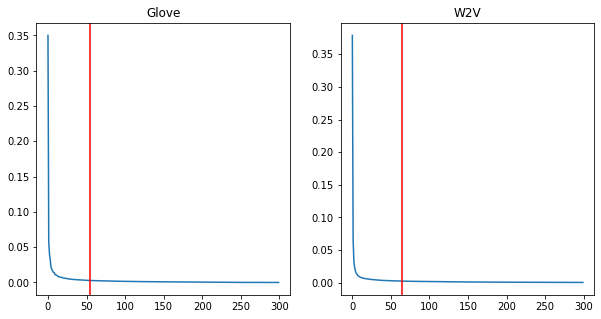

In [ ]:
fig = plt.figure(figsize=(10, 5))
axes = fig.subplots(1, 2)

X = [x_glove, x_w2v]
X_label = ["Glove", "W2V"]
n_composantes_pca = []

for j in range(2):
  pca = PCA()
  X_reduced_pca = pca.fit_transform(X[j])
  y = pca.explained_variance_ratio_

  n_composantes_pca.append(np.where(np.cumsum(y) > 0.80)[0][0])

  x_composantes = np.arange(X[j].shape[1])

  axes[j].plot(x_composantes, y)
  axes[j].set_title(X_label[j])
  axes[j].axvline(n_composantes_pca[j], color="red", label=f"Composante {n_composantes_pca[j]}")

fig.show()

print(f"Nombre composantes considéré pour x_glove : {n_composantes_pca[0]}\nNombre composantes considéré pour x_w2v : {n_composantes_pca[1]}\n")

#### TSNE

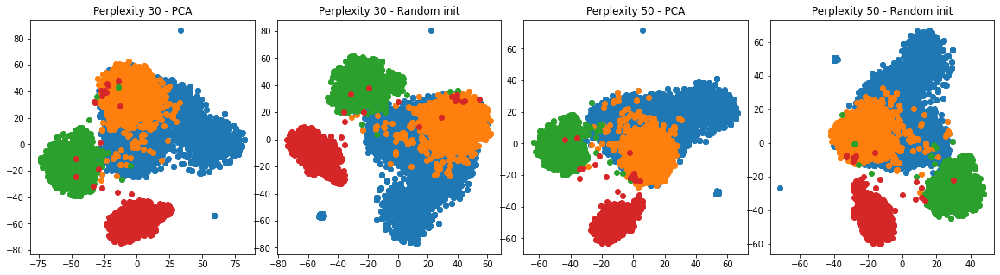

In [ ]:
X = x_w2v
list_X = []

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  list_X.append(TSNE(n_components=2, perplexity=30, init='pca').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=30, init='random').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=50, init='pca').fit_transform(X.copy()))
  list_X.append(TSNE(n_components=2, perplexity=50, init='random').fit_transform(X.copy()))


# ------ Affichage ------

list_X_titles = ["Perplexity 30 - PCA", "Perplexity 30 - Random init", "Perplexity 50 - PCA", "Perplexity 50 - Random init"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

#### Autoencodeurs

100%|██████████| 500/500 [02:46<00:00,  3.01it/s]


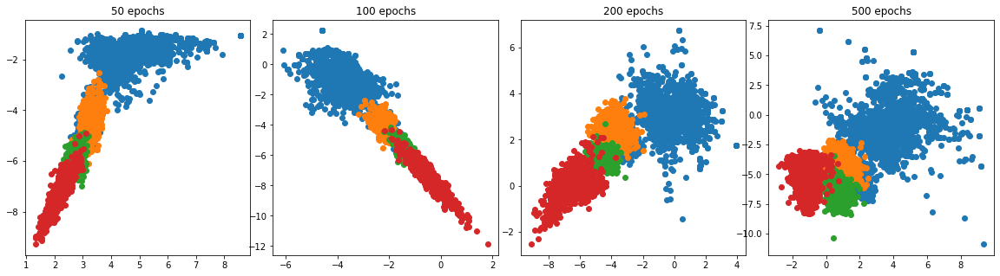

In [ ]:
X = x_w2v.copy().astype(np.float32)
list_X = []

list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=50))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=100))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200))
list_X.append(utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=500))


# ------ Affichage ------

list_X_titles = ["50 epochs", "100 epochs", "200 epochs", "500 epochs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

#### UMAP

/usr/local/lib/python3.7/dist-packages/umap/spectral.py:261: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  "WARNING: spectral initialisation failed! The eigenvector solver\n"


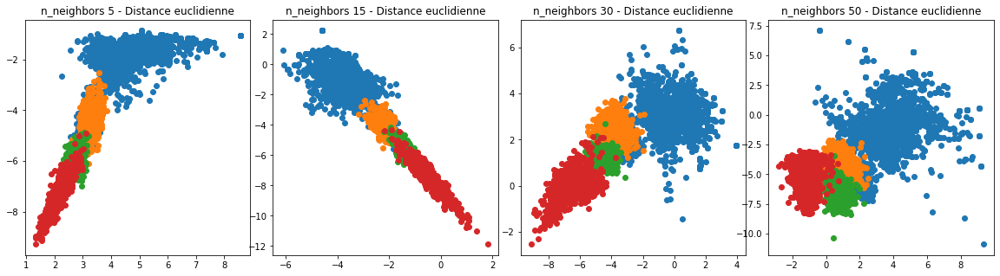

In [ ]:
X = x_w2v
list_X

list_X.append(UMAP(n_components=2, n_neighbors=5).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=15).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy()))
list_X.append(UMAP(n_components=2, n_neighbors=50).fit_transform(X.copy()))


# ------ Affichage ------

list_X_titles = ["n_neighbors 5 - Distance euclidienne", "n_neighbors 15 - Distance euclidienne", 
                 "n_neighbors 30 - Distance euclidienne", "n_neighbors 50 - Distance euclidienne"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

On retient alors les matrices suivantes pour la suite de l'analyse

100%|██████████| 200/200 [01:06<00:00,  3.02it/s]


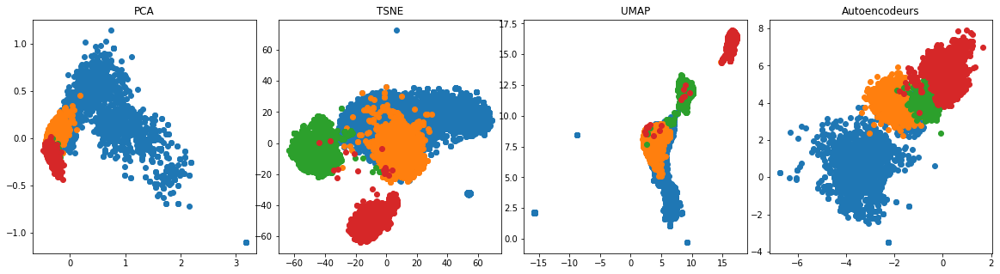

In [ ]:
X = x_w2v.copy().astype(np.float32)

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

### Clustering par k-means




100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


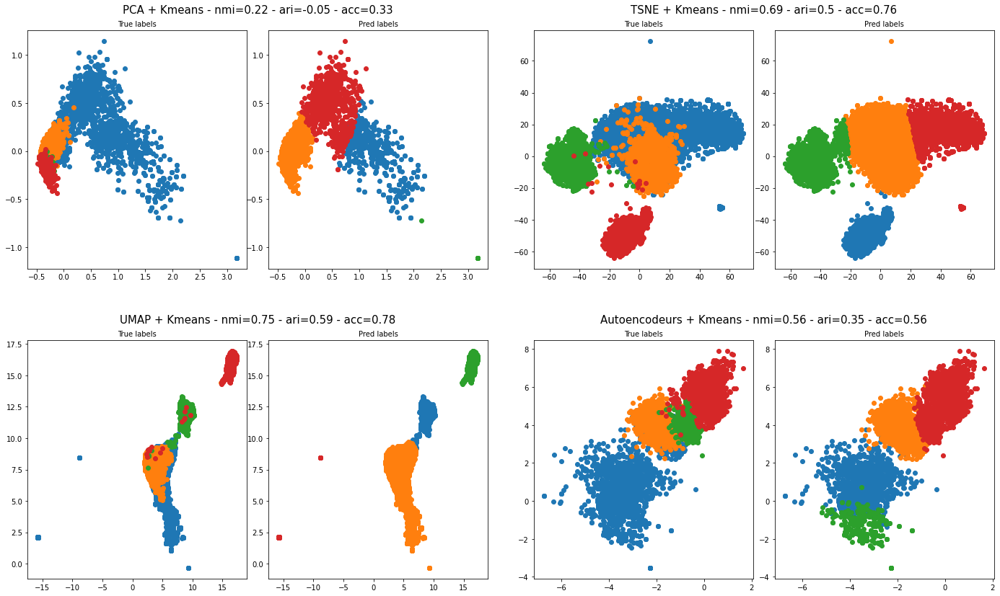

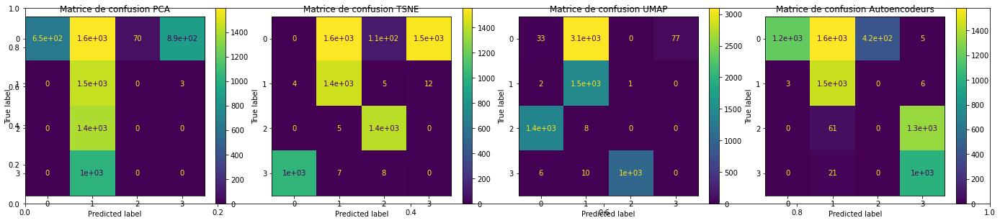

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
  nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
  ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy().astype(np.float32), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:16<00:00,  3.01it

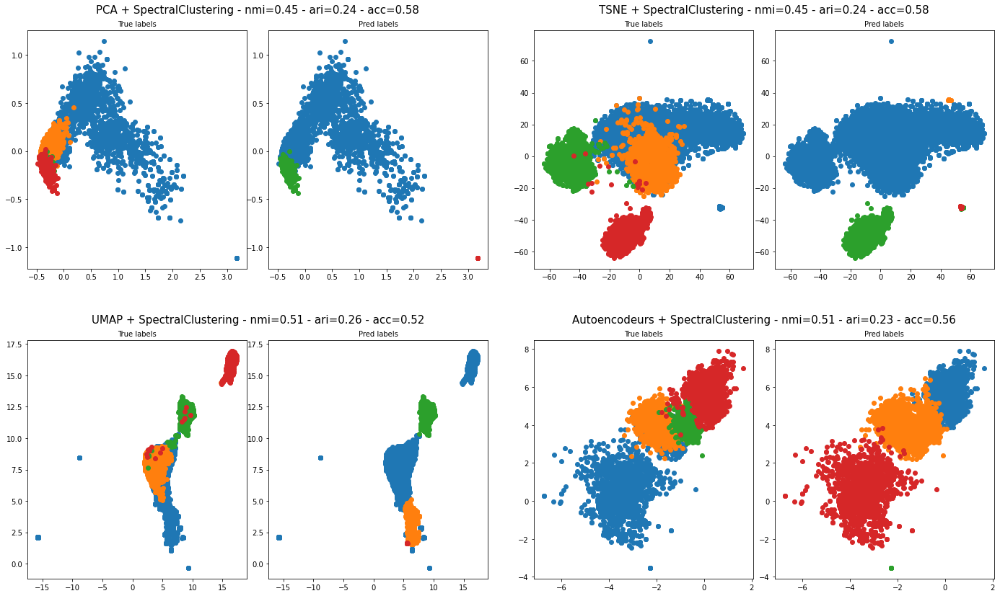

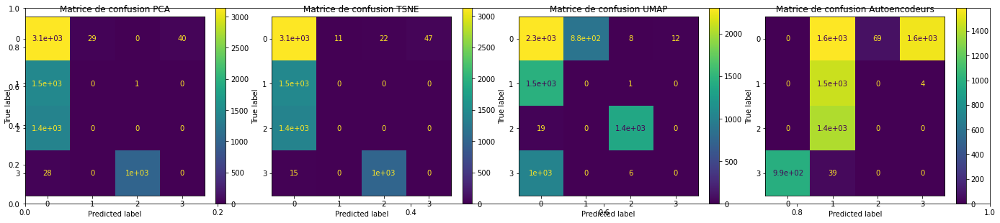

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy().astype(np.float32), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


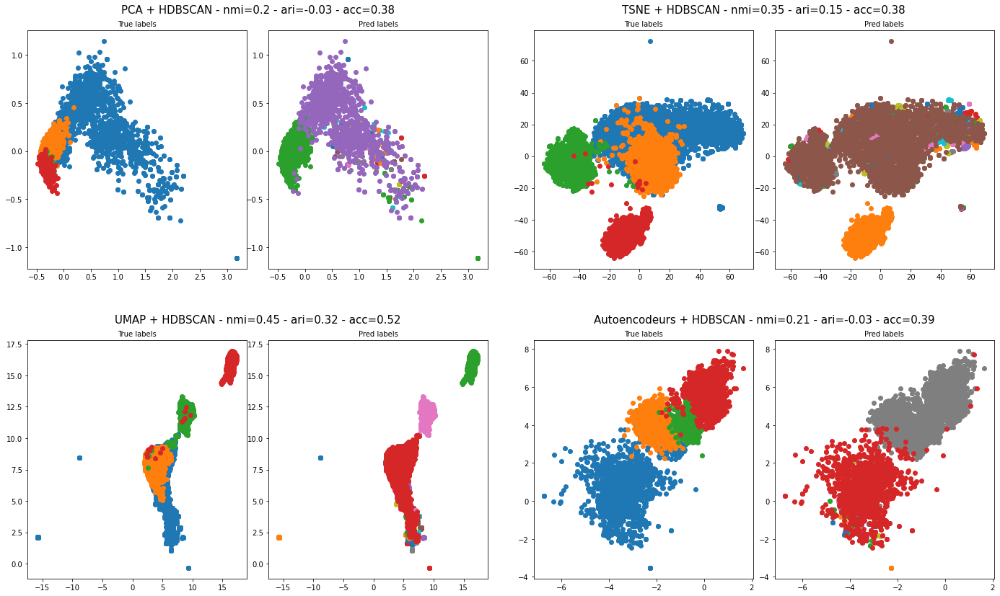

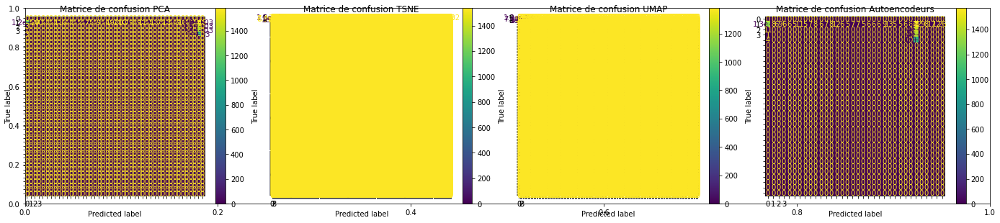

In [ ]:
X = x_w2v

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy().astype(np.float32), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


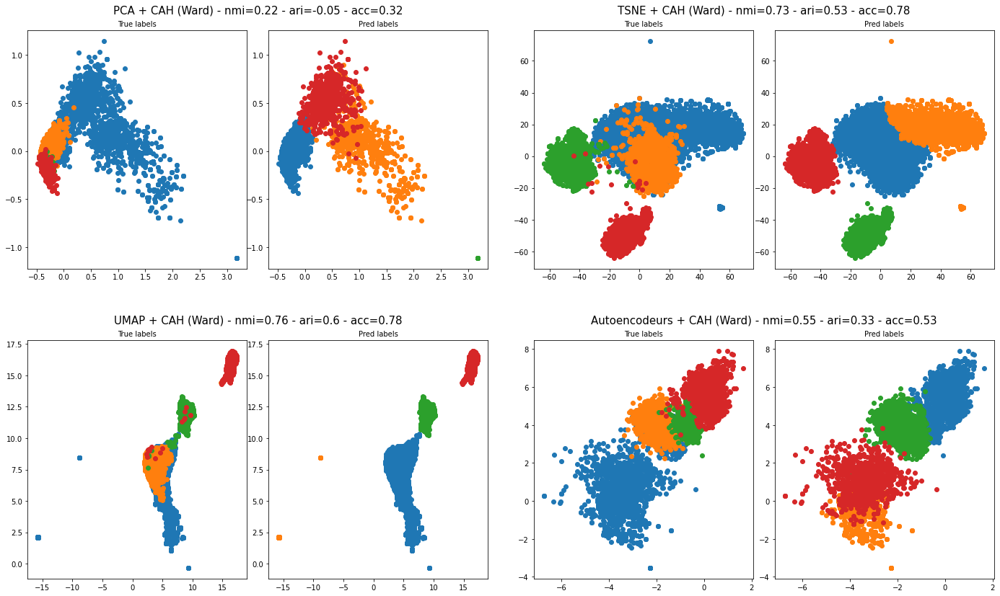

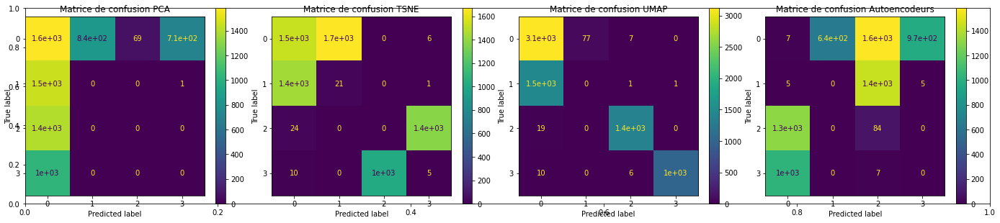

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy().astype(np.float32), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


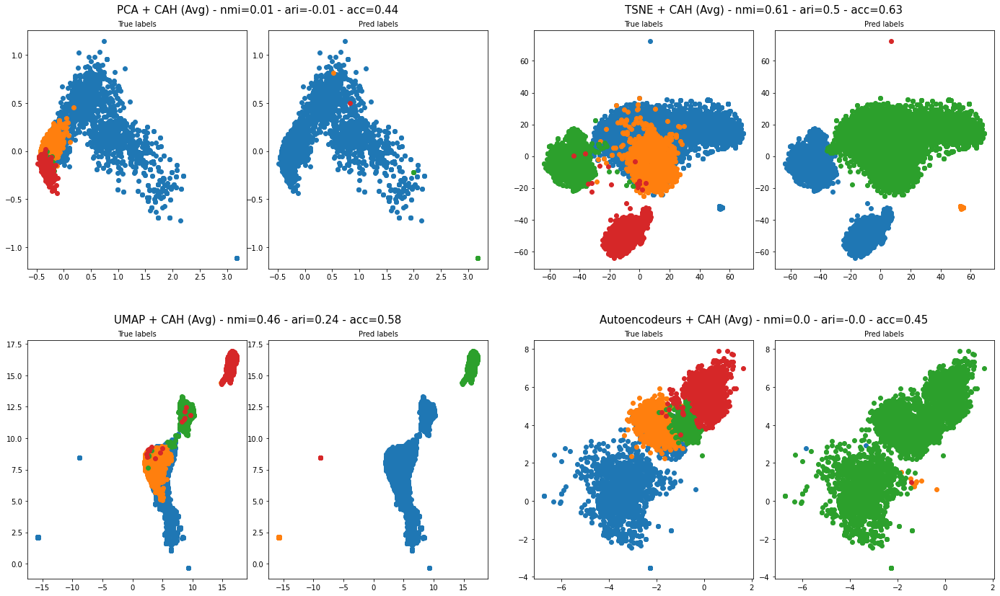

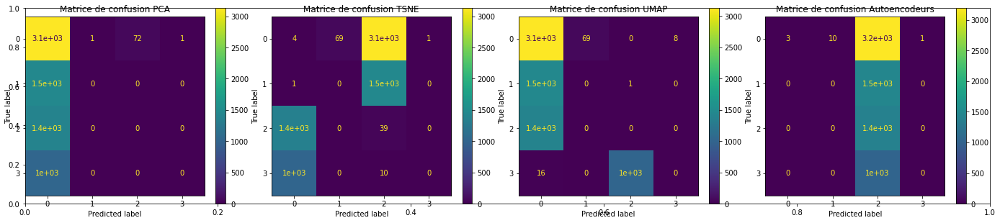

In [ ]:
k = nombre_de_classes
X = x_w2v

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[1], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy().astype(np.float32), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Avg) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.22  0.22  0.69  0.75          0.56
Spectral k-means                   0.74  0.45  0.45  0.51          0.51
HDBSCAN                             0.2   0.2  0.35  0.45          0.21
CAH + Ward                         0.22  0.22  0.73  0.76          0.55
CAH + distance moyenne                0  0.01  0.61  0.46             0 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                           -0.05 -0.05   0.5  0.59          0.35
Spectral k-means                   0.59  0.24  0.24  0.26          0.23
HDBSCAN                           -0.03 -0.03  0.15  0.32         -0.03
CAH + Ward                        -0.05 -0.05  0.53   0.6          0.33
CAH + distance moyenne               -0 -0.01   0.5  0.24            -0 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.

## Matrice Glove

### Méthodes de réduction de dimensions


100%|██████████| 200/200 [01:05<00:00,  3.03it/s]


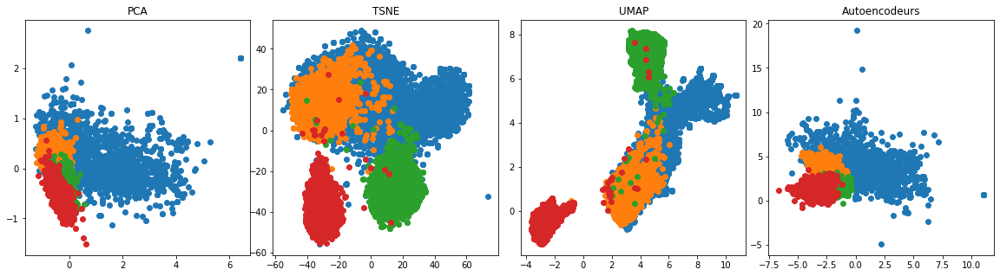

In [ ]:
X = x_glove

X_reduced_pca = PCA(n_components=2, whiten=False).fit_transform(X.copy())
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  X_reduced_tsne = TSNE(n_components=2, perplexity=50, init="pca").fit_transform(X.copy())
  X_reduced_umap = UMAP(n_components=2, n_neighbors=30).fit_transform(X.copy())
  X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 2, learning_rate=1e-3, n_epochs=200)


# ------ Affichage ------

list_X = [X_reduced_pca, X_reduced_tsne, X_reduced_umap, X_reduced_autoencodeurs]
list_X_titles = ["PCA", "TSNE", "UMAP", "Autoencodeurs"]

fig = plt.figure(figsize=(20,5))
outer = gridspec.GridSpec(1, 4, wspace=0.1, hspace=0.3)

for i in range(4):
  axe = plt.Subplot(fig, outer[i])
  for j in set(labels):
    axe.scatter(list_X[i][labels==j, 0], list_X[i][labels==j, 1], label=str(j))
  axe.set_title(list_X_titles[i])
  fig.add_subplot(axe)

fig.show()

### Clustering par k-means


100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


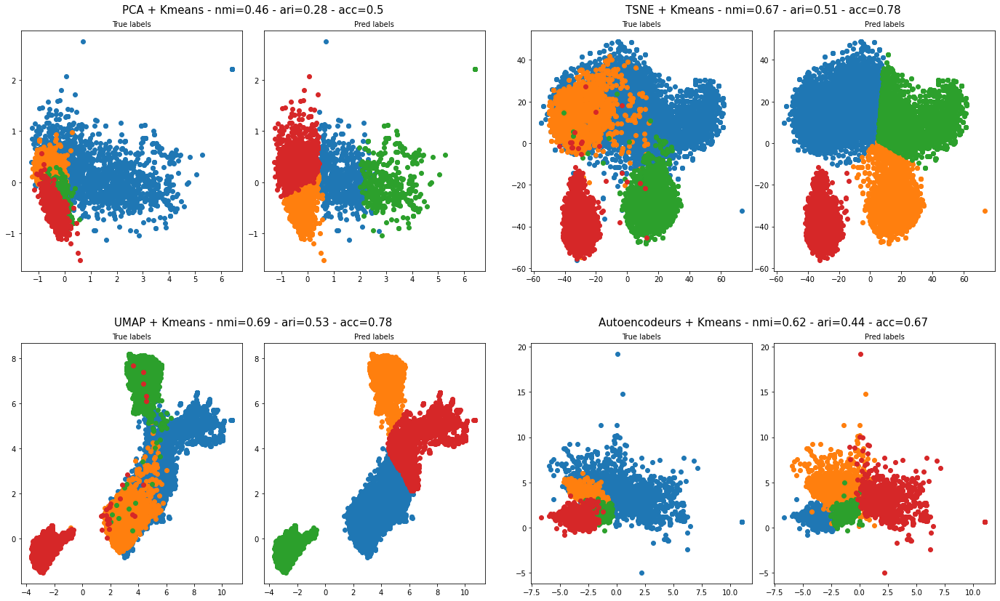

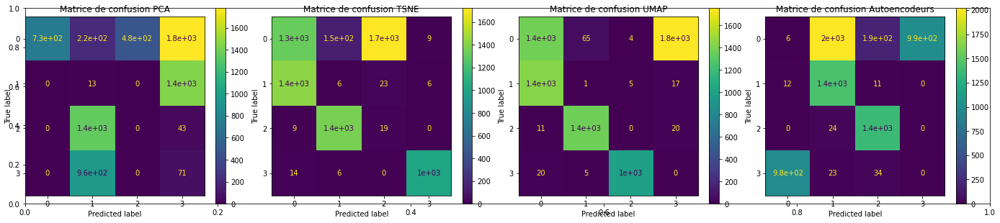

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels = KMeans(k).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_kmeans = [round(accuracy(labels, predicted_labels), 2)]
nmi_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]
ari_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = KMeans(k).fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = KMeans(k).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = KMeans(k).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + Kmeans - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par spectral k-means


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"
100%|██████████| 50/50 [00:16<00:00,  2.98it/s]


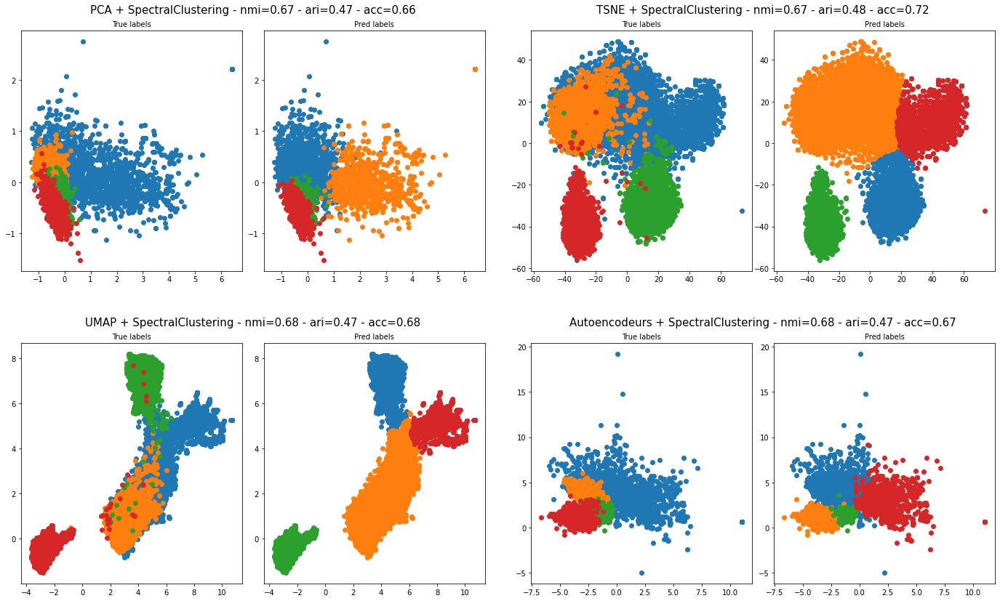

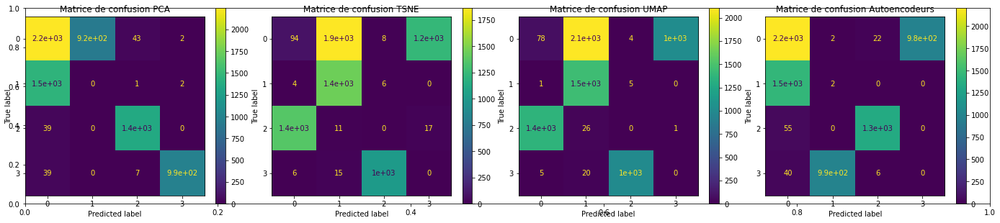

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_spectral_kmeans = [round(accuracy(labels, predicted_labels), 2)]
ari_spectral_kmeans = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_spectral_kmeans = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_pca.copy()).labels_

  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = SpectralClustering(k, affinity="nearest_neighbors", n_neighbors=10).fit(list_X[i].copy()).labels_

  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_spectral_kmeans.append(round(accuracy(labels, pred_labels), 2))
    nmi_spectral_kmeans.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_spectral_kmeans.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + SpectralClustering - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par HDBSCAN

100%|██████████| 50/50 [00:16<00:00,  3.01it/s]


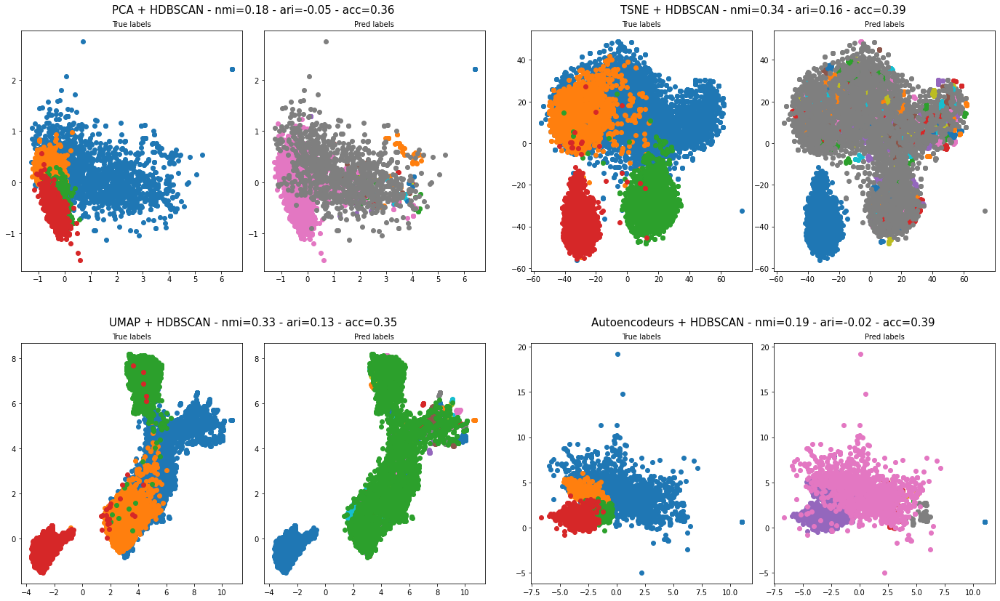

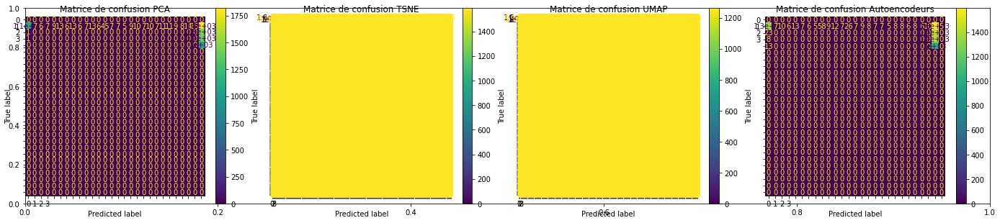

In [ ]:
X = x_glove

predicted_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X.copy()).labels_

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_hdbscan = [round(accuracy(labels, predicted_labels), 2)]
ari_hdbscan = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_hdbscan = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_pca.copy()).labels_
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(X_reduced_autoencodeurs.copy()).labels_
  else:
    pred_labels = hdbscan.HDBSCAN(algorithm='best', alpha=1.0, leaf_size=40, cluster_selection_method="eom", metric="euclidean").fit(list_X[i].copy()).labels_
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_hdbscan.append(round(accuracy(labels, pred_labels), 2))
    nmi_hdbscan.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_hdbscan.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + HDBSCAN - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de Ward


100%|██████████| 50/50 [00:16<00:00,  3.03it/s]


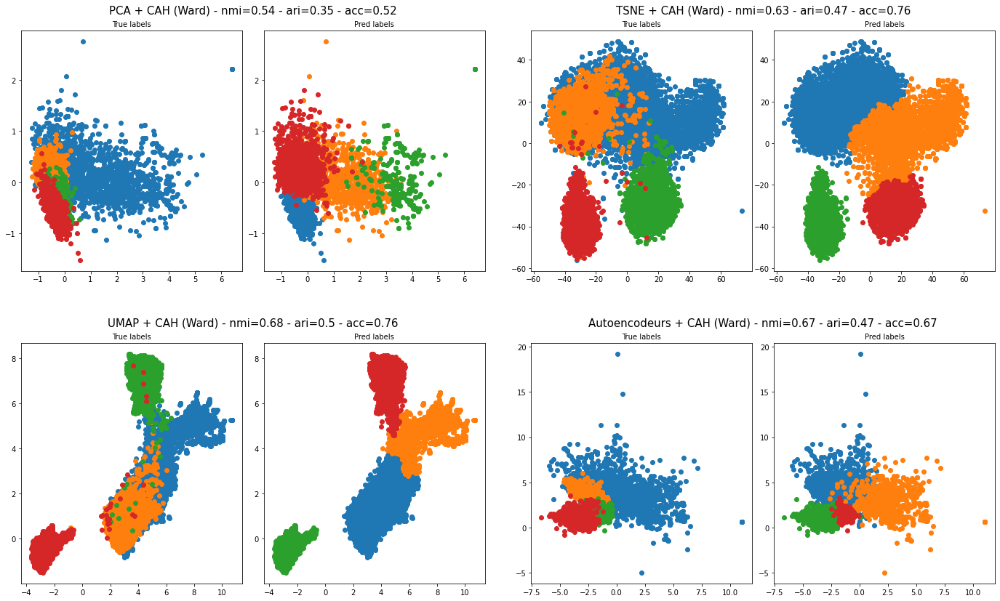

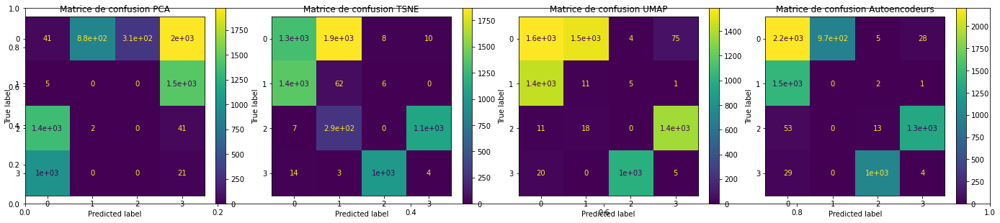

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_ward = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_ward = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_ward = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_ward.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_ward.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_ward.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Clustering par CAH employé avec la distance de moyenne non ponderée


100%|██████████| 50/50 [00:16<00:00,  3.02it/s]


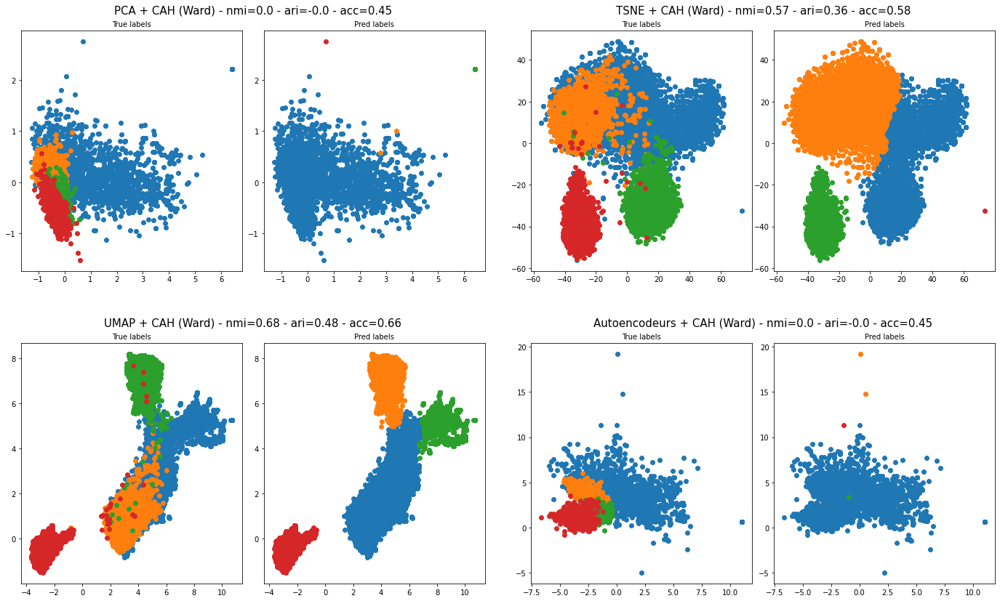

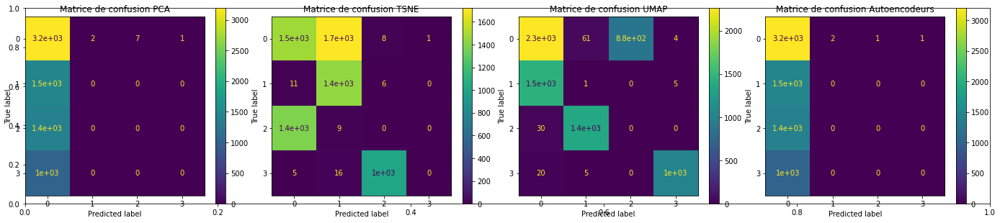

In [ ]:
k = nombre_de_classes
X = x_glove

predicted_labels =  AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X.copy())

with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  accuracy_cah_avg = [round(accuracy(labels, predicted_labels), 2)]
ari_cah_avg = [round(adjusted_rand_score(labels, predicted_labels), 2)]
nmi_cah_avg = [round(normalized_mutual_info_score(labels, predicted_labels), 2)]

list_pred_labels = []
list_titles = []

for i in range(len(list_X)):
  if i==0: # Si X est la matrice reduite par PCA
    #on fait la prediction sur une matrice de plus grande taille obtenue par PCA avec le nombre de composantes determiné plus haut
    X_reduced_pca = PCA(n_components=n_composantes_pca[0], whiten=False).fit_transform(X.copy())
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_pca.copy())
  elif i==3: # Si X est la matrice reduite par autoencodeur
    # on fait la prediction sur une matrice de plus grande taille
    X_reduced_autoencodeurs = utils.autoencoder(X.copy(), 20, learning_rate=1e-3, n_epochs=50)
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(X_reduced_autoencodeurs.copy())
  else:
    pred_labels = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average').fit_predict(list_X[i].copy())
  
  # Sauvgarde des scores
  with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    accuracy_cah_avg.append(round(accuracy(labels, pred_labels), 2))
    nmi_cah_avg.append(round(normalized_mutual_info_score(labels, pred_labels), 2))
    ari_cah_avg.append(round(adjusted_rand_score(labels, pred_labels), 2))

    list_pred_labels.append(pred_labels)
    list_titles.append(f'{list_X_titles[i]} + CAH (Ward) - nmi={round(normalized_mutual_info_score(labels, pred_labels), 2)} - ari={round(adjusted_rand_score(labels, pred_labels), 2)} - acc={round(accuracy(labels, pred_labels), 2)}\n')

affichage(list_X, list_pred_labels, labels, list_titles)

### Comparaison des métriques 

In [ ]:
col_names = ["Espace de départ", "PCA", "TSNE", "UMAP", "Autoencodeurs"]
row_names = ["K-means", "Spectral k-means", "HDBSCAN", "CAH + Ward", "CAH + distance moyenne"]

list_nmi = [nmi_kmeans, nmi_spectral_kmeans, nmi_hdbscan, nmi_cah_ward, nmi_cah_avg]
list_ari = [ari_kmeans, ari_spectral_kmeans, ari_hdbscan, ari_cah_ward, ari_cah_avg]
list_accuracy = [accuracy_kmeans, accuracy_spectral_kmeans, accuracy_hdbscan, accuracy_cah_ward, accuracy_cah_avg]

nmi_df = pd.DataFrame(columns=col_names, index=row_names)
ari_df = pd.DataFrame(columns=col_names, index=row_names)
accuracy_df = pd.DataFrame(columns=col_names, index=row_names)

for i in range(5):
  nmi_df.loc[row_names[i]] = list_nmi[i]
  ari_df.loc[row_names[i]] = list_ari[i]
  accuracy_df.loc[row_names[i]] = list_accuracy[i]

print("NMI \n", nmi_df, "\n")
print("ARI \n", ari_df, "\n")
print("Accuracy \n", accuracy_df)

NMI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.46  0.46  0.67  0.69          0.62
Spectral k-means                   0.67  0.67  0.67  0.68          0.68
HDBSCAN                             0.2  0.18  0.34  0.33          0.19
CAH + Ward                         0.53  0.54  0.63  0.68          0.67
CAH + distance moyenne                0     0  0.57  0.68             0 

ARI 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                            0.29  0.28  0.51  0.53          0.44
Spectral k-means                   0.47  0.47  0.48  0.47          0.47
HDBSCAN                           -0.03 -0.05  0.16  0.13         -0.02
CAH + Ward                         0.35  0.35  0.47   0.5          0.47
CAH + distance moyenne               -0    -0  0.36  0.48            -0 

Accuracy 
                        Espace de départ   PCA  TSNE  UMAP Autoencodeurs
K-means                             0

# Partie 2 



## Matrice Word2Vec

### Reduced K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.33
NMI :  0.22
ARI :  -0.05


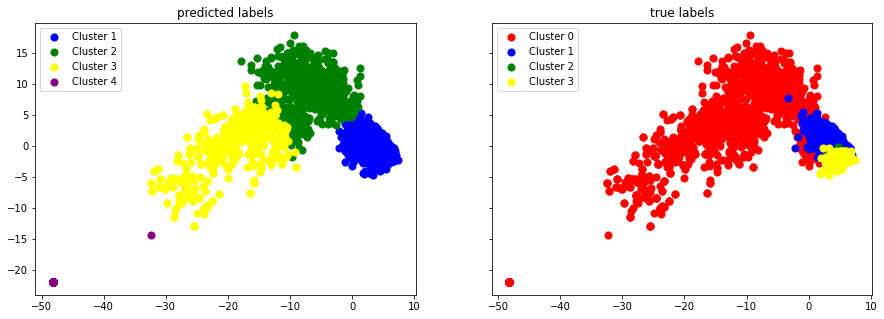

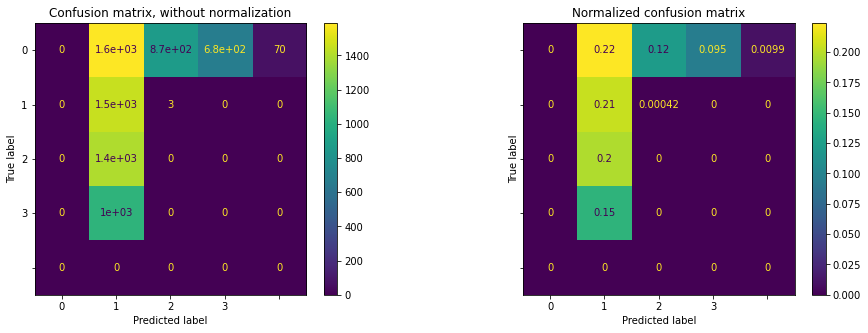

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
import tensorflow.compat.v1 as tf

n_components = 15
X = x_w2v
k = nombre_de_classes


rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = rkm[0]

X_reduced = rkm = rkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_rkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_rkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Reduced k-means sur le jeu de données classic4 présente de mauvais résultats. Les 3 métriques d'évaluation ont un score très fiables.

Au niveau de la visualisation 2D, on voit qu'une classe est très présente, probablement celle qui a le plus d'objets, tandis qu'une autre est très peu visible.

### Factorial K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.57
NMI :  0.51
ARI :  0.34


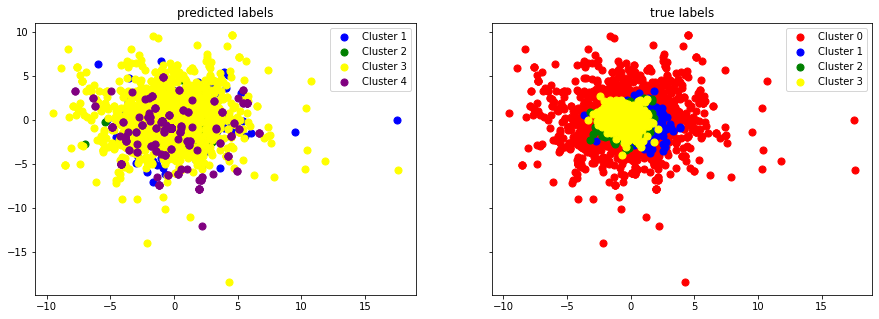

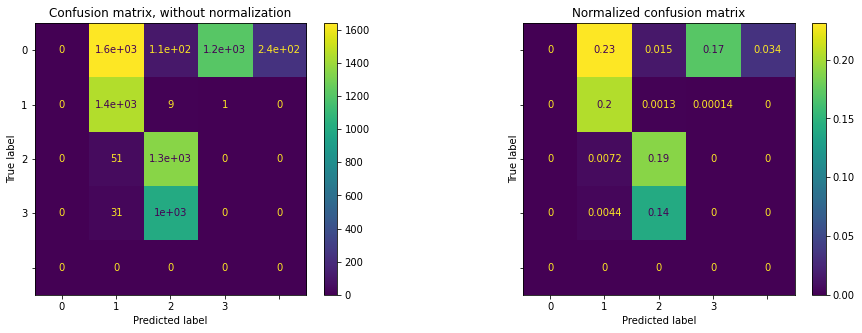

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = fkm[0]

X_reduced = fkm = fkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_fkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_fkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Factorial k-means sur le jeu de données classic4 présente des résultats moyens. Les 3 métriques d'évaluation ont un score fiable (autour de 50%).

Au niveau de la visualisation 2D, on voit que les 4 clusters se superposent.

### Deep Clustering Network (DCN)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:04<00:00, 10.09it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:33<00:00,  1.51it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.3
NMI :  0.21
ARI :  -0.06


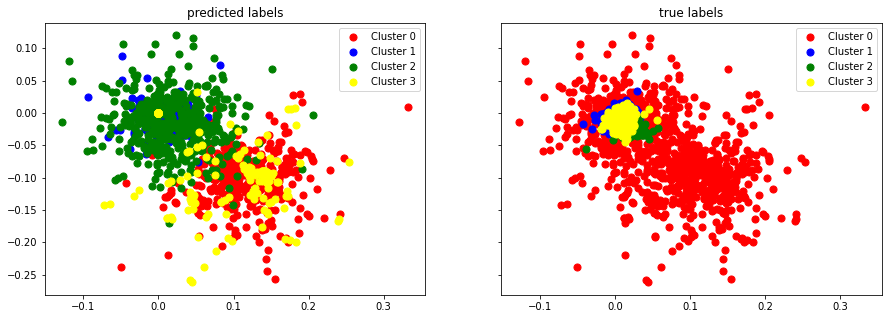

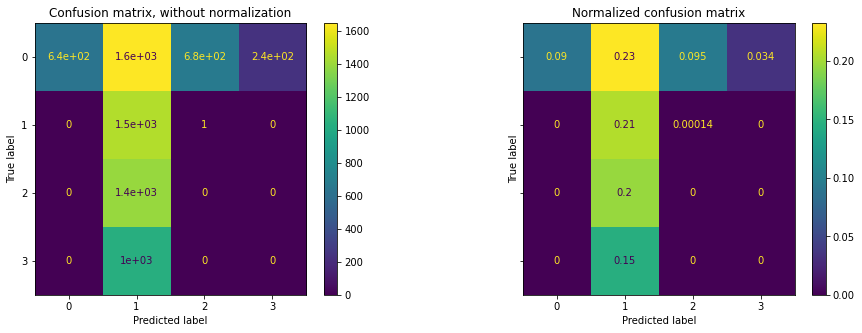

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dcn_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dcn_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep Clustering Network sur le jeu de données classic4 présente de mauvais résultats. Les 3 métriques d'évaluation ont un score très fiables.

### Deep k-means (DKM)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:05<00:00,  9.01it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:19<00:00,  1.02it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.45
NMI :  0.0
ARI :  0.0


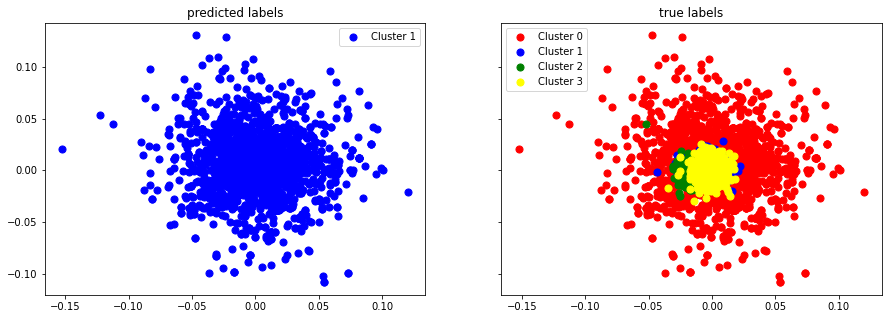

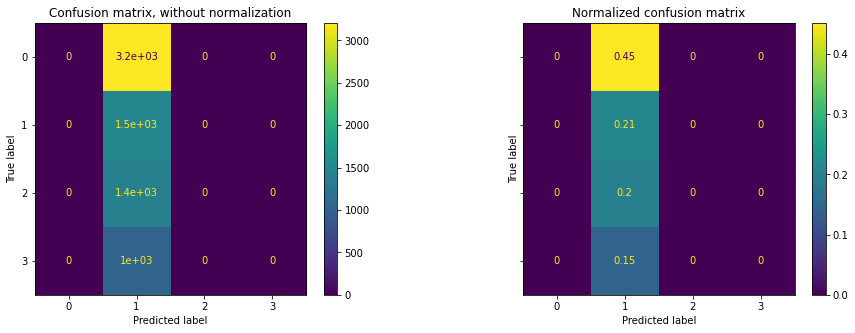

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep k-means sur le jeu de données classic4 présente de très mauvais résultats. 2 des 3 métriques d'évaluation ont un score nul. La méthode n'a détecté qu'un seul cluster.

Au niveau de la visualisation 2D, on ne voit qu'un seul cluster.

### Tableau récapitulatif

In [ ]:
df_w2v_bbc = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm_w2v_bbc, acc_fkm_w2v_bbc, acc_dcn_w2v_bbc, acc_dkm_w2v_bbc], 
                                  [nmi_rkm_w2v_bbc, nmi_fkm_w2v_bbc, nmi_dcn_w2v_bbc, nmi_dkm_w2v_bbc],
                                  [ari_rkm_w2v_bbc, ari_fkm_w2v_bbc, ari_dcn_w2v_bbc, ari_dkm_w2v_bbc],
                                  ])
df_w2v_bbc

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.33,0.57,0.30,0.45
NMI,0.22,0.51,0.21,0.00
ARI,-0.05,0.34,-0.06,0.00


Les 4 techniques ont des performances similaires. Leurs résultats sont assez mauvais en termes de NMI et ARI. Deep k-means ressort parmi les 4 car il n'a détecté qu'un seul cluster.

## Matrice glove

### Reduced K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.5
NMI :  0.49
ARI :  0.32


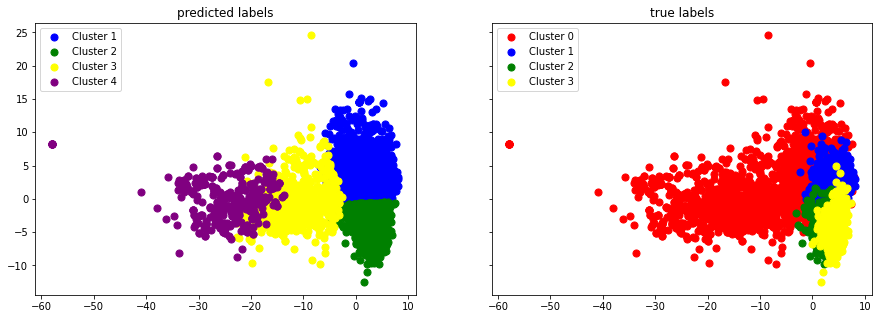

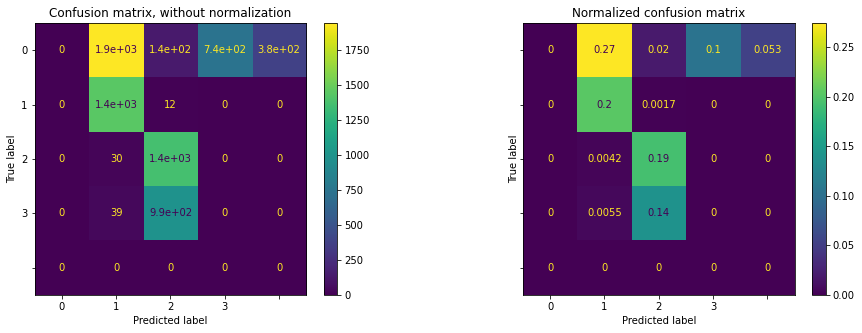

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
n_components = 15
X = x_glove
k = nombre_de_classes

rkm = fcps.TandemClustering(X, k, Type='Reduced', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = rkm[0]

X_reduced = rkm = rkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_rkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_rkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_rkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Reduced k-means sur le jeu de données classic4 présente des résultats moyens. Les 3 métriques d'évaluation ont un score fiable (autour de 50%).

### Factorial K-means

  |======================================================================| 100%

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.5
NMI :  0.43
ARI :  0.26


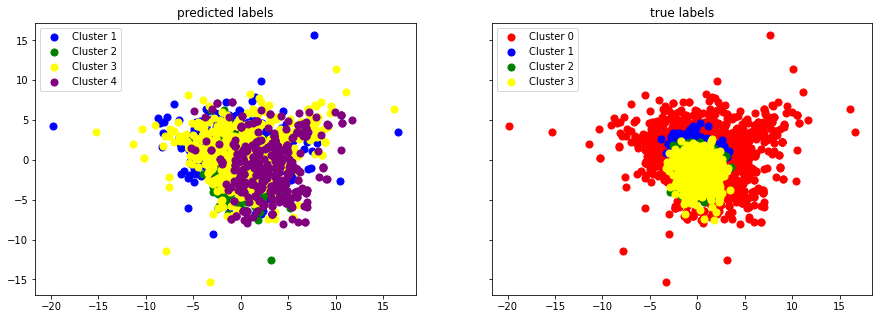

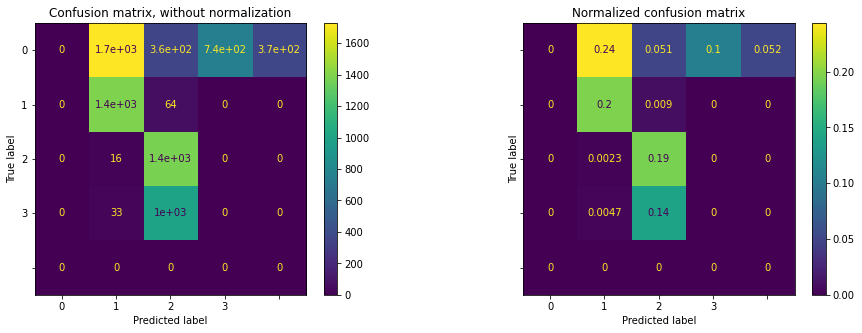

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
fkm = fcps.TandemClustering(X, k, Type='Factorial', PlotIt=False, ndim=n_components, nstart=16)
pred_labels = fkm[0]

X_reduced = fkm = fkm[1][0]

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_fkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_fkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_fkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Factorial k-means sur le jeu de données classic4 présente des résultats moyens. Les 3 métriques d'évaluation ont un score fiables (autour de 50%).

### Deep Clustering Network (DCN)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:30<00:00,  1.62it/s]


Running k-means on the learned embeddings...
Starting DCN training...


100%|██████████| 50/50 [00:33<00:00,  1.48it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.48
NMI :  0.47
ARI :  0.29


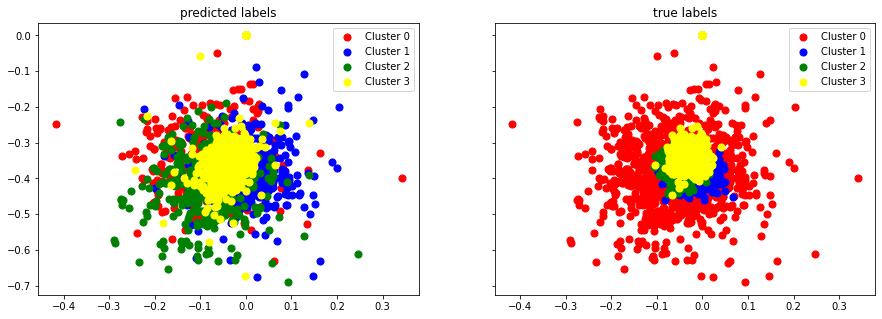

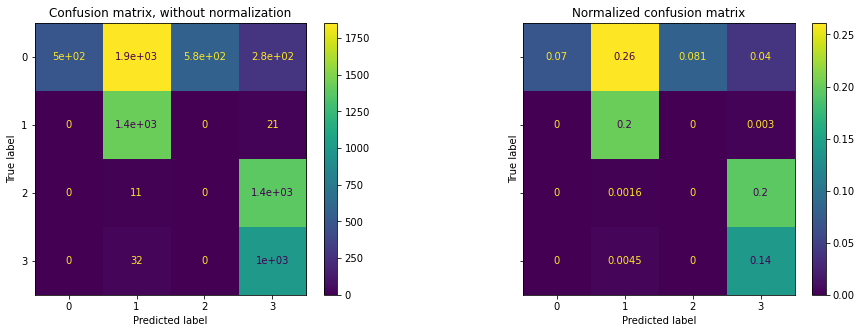

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DCN(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=50, lambda_=1.0, batch_size=256, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dcn_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dcn_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dcn_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep Clustering Network sur le jeu de données classic4 présente des résultats moyens. Les 3 métriques d'évaluation ont un score fiables (autour de 50%).

### Deep k-means (DKM)

/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/DKM_DCN_tf_py.py:21: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  input = tf.layers.dense(inputs=input, units=dimension, activation=activation, name=name, reuse=tf.AUTO_REUSE)
/usr/local/lib/python3.7/dist-packages/keras/legacy_tf_layers/core.py:255: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  return layer.apply(inputs)


Starting autoencoder pretraining...


100%|██████████| 50/50 [00:05<00:00,  9.02it/s]


Running k-means on the learned embeddings...
Starting DKM training...


100%|██████████| 20/20 [00:20<00:00,  1.00s/it]
/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)



Accuracy :  0.45
NMI :  0.0
ARI :  -0.0


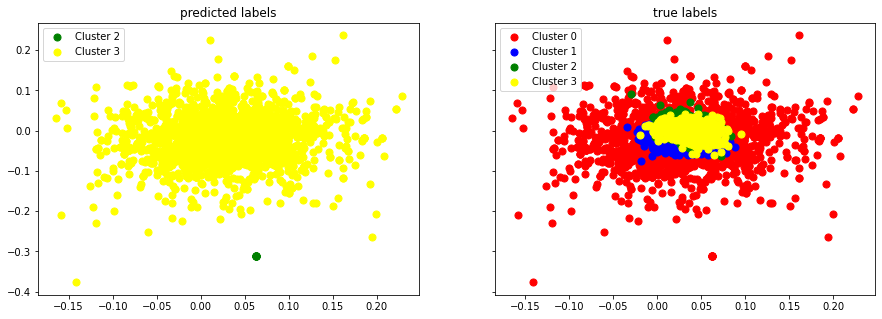

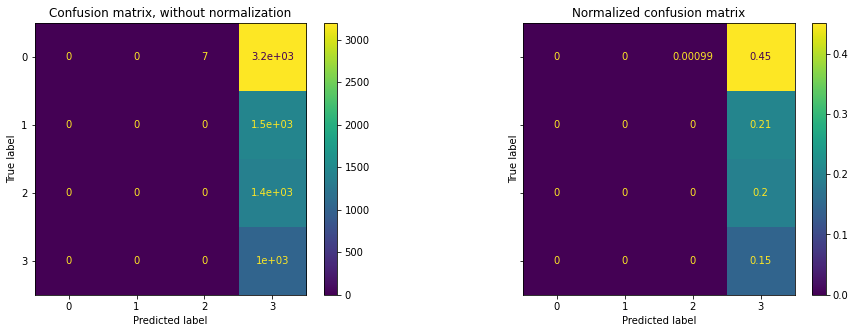

/usr/local/lib/python3.7/dist-packages/sklearn/utils/linear_assignment_.py:128: FutureWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  FutureWarning)


In [ ]:
# reset graph 
tf.reset_default_graph()

X_reduced, pred_labels = DKM(X, k, n_components, n_pretrain_epochs=50, n_finetuning_epochs=5, lambda_=1.0, batch_size=258, seed=None, cpu=False)

eval_clustering_2D(X_reduced, pred_labels, labels)

acc_dkm_w2v_bbc = round(accuracy(labels, pred_labels), 2)
nmi_dkm_w2v_bbc = round(normalized_mutual_info_score(labels, pred_labels), 2)
ari_dkm_w2v_bbc = round(adjusted_rand_score(labels, pred_labels), 2)

L'application du Deep k-means sur le jeu de données classic4 présente de très mauvais résultats. 2 des 3 métriques d'évaluation ont un score nul. La méthode n'a détecté que deux clusters.

Au niveau de la visualisation 2D, on ne voit que 2 clusters dont un avec un seul point.  

### Tableau récapitulatif

In [ ]:
df_w2v_bbc = pd.DataFrame(index = ["Accuracy", "NMI", "ARI"],
                            columns=["Reduced k-means", "Factorial k-means", "Deep clustering network", "Deep k-means"], 
                            data=[[acc_rkm_w2v_bbc, acc_fkm_w2v_bbc, acc_dcn_w2v_bbc, acc_dkm_w2v_bbc], 
                                  [nmi_rkm_w2v_bbc, nmi_fkm_w2v_bbc, nmi_dcn_w2v_bbc, nmi_dkm_w2v_bbc],
                                  [ari_rkm_w2v_bbc, ari_fkm_w2v_bbc, ari_dcn_w2v_bbc, ari_dkm_w2v_bbc],
                                  ])
df_w2v_bbc

,Reduced k-means,Factorial k-means,Deep clustering network,Deep k-means
Accuracy,0.50,0.50,0.48,0.45
NMI,0.49,0.43,0.47,0.00
ARI,0.32,0.26,0.29,-0.00


Les méthodes Reduced, Factorial K-means et Deep clustering Network ont des résultats très faibles (< 50%). Toutefois, c'est Deep k-means qui se démarque en ne produisant que 2 clusters.  

On peut remarquer que les méthodes de réduction de dimensions et de clustering simultanés ont de mauvais résultats sur le jeu de données classic4, que ce soit avec Word2vec ou Glove. Deep k-means performe le plus mal en ne trouvant que 1 ou 2 clusters. On peut peut-etre attribuer cela au déséquilibre entre les classes. 

# Conlusion


De manière générale, on constate que :

*   On obtient des meilleurs résultats sur le dataset bcc dont les classes sont équilibrées contrairement au jeu de données classic4 pour lequel une classe est largement répresentée ("cacm")
*   Pour les deux datasets, la matrice Word2Vec semble le mieux representer nos documents et par conséquent donne des meilleurs résultats que la matice glove
*   Les méthodes tandem marchent globalement mieux que les méthodes de classification combinés



Sauvegarde du notebook en format html

In [ ]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc
!jupyter nbconvert --to html "/content/drive/MyDrive/Cours/M2/Analyse factorielle/projet/projet_analyse_factorielle.ipynb"